<a href="https://colab.research.google.com/github/MartaAmoresCastillejo/DATA/blob/main/TFG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Carga y librerías

In [ ]:
!pip install keras-tuner

In [ ]:
import pandas as pd
from tensorflow.keras import models, layers, Input
import tensorflow as tf
import keras_tuner as kt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as datetime
from plotly.subplots import make_subplots
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.graph_objects as go
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.tree import DecisionTreeRegressor, plot_tree, export_text
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LassoCV
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from joblib import Parallel, delayed, cpu_count
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras import optimizers
from kerastuner.tuners import RandomSearch
import multiprocessing

In [ ]:
df = pd.read_csv('TFG_DATOS.csv')

In [ ]:
df2025 = pd.read_csv('VALIDACION.csv')

#Crear nuevas variables

La columna fecha se encuentra según el formato aaaa-mm-dd, queremos una nueva columna donde se distingan los días de la semana:

  0 - lunes
  1 - martes
  2- miércoles
  3 - jueves
  4 - viernes
  5 - sábado
  6 - domingo

Otra columna que distinga fin de semana:

  0 - Día laboral
  1 - Fin de semana

Se determinan los festivos nacionales para la nueva columna de Tipo día.

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
print(df.columns)

Index(['date', 'hour', 'Residuos domésticos', 'Turbinación bombeo',
       'Residuos no renovables', 'Exportación Andorra', 'Nuclear', 'Genéricas',
       'Solar fotovoltaica', 'Hidráulica', 'Generación + Bombeo + Cable',
       'Exportación Marruecos', 'Exportación Francia',
       'Gas Natural Cogeneración', 'Saldo Francia', 'Importación Portugal',
       'Cogeneración', 'Saldo interconexiones', 'Hidráulica no UGH',
       'Saldo Marruecos', 'Generación P48 total', 'Ciclo combinado', 'Biomasa',
       'Exportación Portugal', 'Exportación Total',
       'Generación + Interconexiones', 'Importación Francia', 'Saldo Andorra',
       'Biogás', 'Solar térmica', 'Importación Total', 'Subproductos minería',
       'Enlace Baleares', 'Fuel', 'Derivados petróleo o carbón', 'Carbón',
       'Hidráulica UGH', 'Fuel-Gas', 'Importación Marruecos', 'Consumo bombeo',
       'Hulla sub-bituminosa', 'Hulla antracita', 'Saldo Portugal',
       'Demanda Peninsular', 'Océano y geotérmica', 'Residuos var

In [ ]:
df['date'] = pd.to_datetime(df['date'])
df['DiaSemana'] = df['date'].dt.dayofweek

festivos_nacionales = [
    (1, 1),    # Año Nuevo
    (6, 1),    # Reyes
    (1, 5),    # Día del Trabajador
    (15, 8),   # Asunción
    (12, 10),  # Fiesta Nacional
    (1, 11),   # Todos los Santos
    (6, 12),   # Constitución
    (8, 12),   # Inmaculada
    (25, 12)   # Navidad
]

def codificar_tipo_dia(row):
    if (row['date'].day, row['date'].month) in festivos_nacionales:
        return 2
    elif row['DiaSemana'] >= 5:
        return 1
    else:
        return 0

df['TipoDia'] = df.apply(codificar_tipo_dia, axis=1)

Ahora vamos a diferenciar las horas del día:

  0 - Entre las 7:00 y las 22:00
  1 - Entre las 23:00 y las 6:00

In [ ]:
df['HoraDia'] = pd.to_numeric(df['hour'], errors='coerce').astype(int)
df['HoraTrabajo'] = df['HoraDia'].apply(lambda x: 1 if 8 <= x <= 18 else 0)

Por últimos vamos a crear dos columnas diferenciando los años y los meses

In [ ]:
df['Año'] = df['date'].dt.year
df['Mes'] = df['date'].dt.month

Vamos a diferenciarnos por estaciones también

In [ ]:
def obtener_estacion_fecha(date):
    año = date.year
    primavera = pd.Timestamp(f"{año}-03-21")
    verano     = pd.Timestamp(f"{año}-06-21")
    otoño      = pd.Timestamp(f"{año}-09-23")
    invierno   = pd.Timestamp(f"{año}-12-21")

    if date >= invierno or date < primavera:
        return 0  # Invierno
    elif primavera <= date < verano:
        return 1  # Primavera
    elif verano <= date < otoño:
        return 2  # Verano
    else:
        return 3  # Otoño

df['Estacion'] = df['date'].apply(obtener_estacion_fecha)

Creamos variables:


*   Generación solar térmica + fotovoltaica
*   Ciclo combinado + Gas Natural Cogeneracion + Cogeneracion
*   Demanda - generacion solar - eolica - nuclear



In [ ]:
df['Generacion_Solar'] = df['Solar fotovoltaica'] + df['Solar térmica']
df['Generacion_CCGT'] = df['Ciclo combinado'] + df['Gas Natural Cogeneración'] + df['Cogeneración']
df['Hueco_Termico'] = df['Demanda Peninsular'] - df['Generacion_Solar'] - df['Eólica'] - df['Nuclear']
df['Eólica'] = df['Eólica'] + df['Eólica terrestre']

In [ ]:
df = df.drop('Demanda', axis=1)

# Limpieza de datos

## Valores nulos

Primero vamos a ver que hacemos con los valores nulos o faltantes, lo observamos por columnas.

A continucación, cambiamos las columnas a nombres más 'bonitos' por si fuera necesario en algun gráfico.

In [ ]:
df2025 = df2025.fillna(0)

In [ ]:
columnas = {
    'date': 'Fecha',
    'hour': 'Hora',
    'Residuos domésticos': 'Residuos domésticos',
    'Turbinación bombeo': 'Turbinación por bombeo',
    'Residuos no renovables': 'Residuos no renovables',
    'Exportación Andorra': 'Exportación a Andorra',
    'Nuclear': 'Generación nuclear',
    'Genéricas': 'Generación genérica',
    'Solar fotovoltaica': 'Solar fotovoltaica',
    'Hidráulica': 'Hidráulica total',
    'Generación + Bombeo + Cable': 'Generación + Bombeo + Cable',
    'Exportación Marruecos': 'Exportación a Marruecos',
    'Exportación Francia': 'Exportación a Francia',
    'Gas Natural Cogeneración': 'Cogeneración gas natural',
    'Saldo Francia': 'Saldo con Francia',
    'Importación Portugal': 'Importación desde Portugal',
    'Cogeneración': 'Cogeneración',
    'Saldo interconexiones': 'Saldo interconexiones',
    'Hidráulica no UGH': 'Hidráulica no UGH',
    'Saldo Marruecos': 'Saldo con Marruecos',
    'Generación P48 total': 'Generación total (P48)',
    'Ciclo combinado': 'Ciclo combinado',
    'Biomasa': 'Biomasa',
    'Exportación Portugal': 'Exportación a Portugal',
    'Exportación Total': 'Exportación total',
    'Generación + Interconexiones': 'Generación + Interconexiones',
    'Importación Francia': 'Importación desde Francia',
    'Saldo Andorra': 'Saldo con Andorra',
    'Biogás': 'Biogás',
    'Solar térmica': 'Solar térmica',
    'Importación Total': 'Importación total',
    'Subproductos minería': 'Subproductos de minería',
    'Enlace Baleares': 'Enlace con Baleares',
    'Fuel': 'Fuel',
    'Derivados petróleo o carbón': 'Derivados petróleo/carbón',
    'Carbón': 'Carbón',
    'Hidráulica UGH': 'Hidráulica UGH',
    'Fuel-Gas': 'Fuel-Gas',
    'Importación Marruecos': 'Importación desde Marruecos',
    'Consumo bombeo': 'Consumo por bombeo',
    'Hulla sub-bituminosa': 'Hulla sub-bituminosa',
    'Hulla antracita': 'Hulla antracita',
    'Saldo Portugal': 'Saldo con Portugal',
    'Demanda Peninsular': 'Demanda peninsular',
    'Océano y geotérmica': 'Energía oceánica y geotérmica',
    'Residuos varios': 'Otros residuos',
    'Hibridación': 'Hibridación',
    'Total Almacenamiento': 'Almacenamiento total',
    'Energía residual': 'Energía residual',
    'Ajuste P48': 'Ajuste del programa P48',
    'Eólica terrestre': 'Eólica terrestre',
    'Otras renovables': 'Otras renovables',
    'Eólica': 'Eólica total',
    'SPOT_ESP': 'Precio SPOT España',
    'SPOT_FR': 'Precio SPOT Francia',
    'SPOT_POR': 'Precio SPOT Portugal',
    'tmed_diaria': 'Temperatura media diaria',
    'pmed_diaria': 'Presión media diaria',
    'GenCO2': 'Generación CO₂',
    'Demanda': 'Demanda',
    'PrecioGas': 'Precio del gas',
    'PVPC': 'Precio PVPC',
    'DiaSemana': 'Día de la semana',
    'TipoDia': 'Tipo de día',
    'Fecha': 'Fecha (extraída)',
    'HoraDia': 'Hora del día',
    'HoraTrabajo': 'Hora laboral',
    'Año': 'Año',
    'Mes': 'Mes',
    'Estación': 'Estación'
}

Contamos valores nulos

/tmp/ipython-input-650-3005864030.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




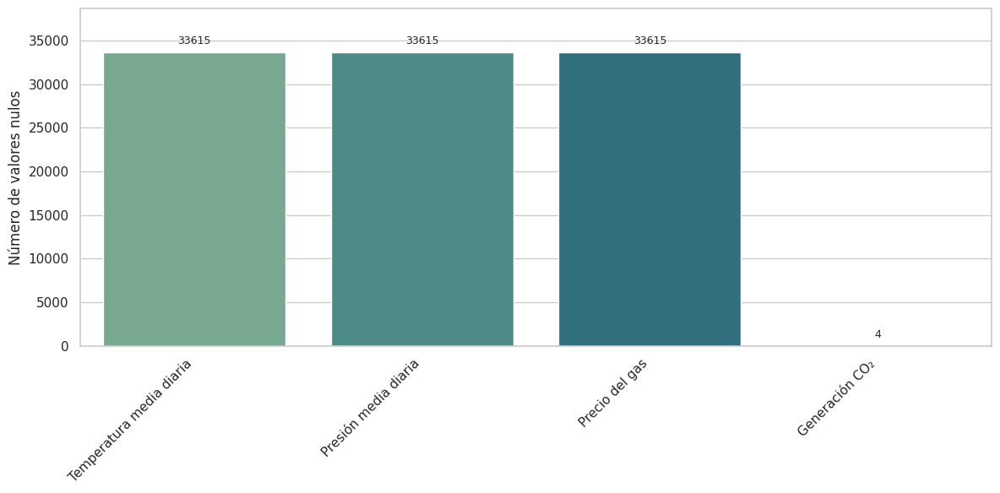

In [ ]:
null_counts = df.isna().sum()
null_counts = null_counts[null_counts > 0].sort_values(ascending=False)

cols   = null_counts.index.tolist()
counts = null_counts.values
pretty = [columnas.get(c, c) for c in cols]

plt.figure(figsize=(max(12, len(cols)*0.5), 6))
sns.barplot(
    x=cols,
    y=counts,
     palette=sns.color_palette("crest", len(cols))
)

for x, y in enumerate(counts):
  plt.text(x, y + max(counts)*0.02, str(int(y)), ha='center', va='bottom', fontsize=9)

plt.ylim(0, max(counts) * 1.15)
plt.xticks(ticks=range(len(cols)), labels=pretty, rotation=45, ha='right')
plt.ylabel("Número de valores nulos")
plt.title("")
plt.tight_layout()
plt.show()

¿Cuáles son esos 4 registros nulos?

In [ ]:
col = ['GenCO2',]
filas = df[df['GenCO2'].isna()]
filas[['date', 'hour'] + col]

,date,hour,GenCO2
2067,2021-03-28,2,NaN
10806,2022-03-27,2,NaN
19545,2023-03-26,2,NaN
28452,2024-03-31,2,NaN


Hacen referencia al cambio de horario a verano, por eso salen nulos, los imputamos con la media anterior y posterior.

In [ ]:
i = [2067, 10806, 19545, 28452]

cols = ['GenCO2']

for idx in i:
    idx_prev = idx - 1
    idx_next = idx + 1

    for col in cols:
        v_prev = df.at[idx_prev, col]
        v_next = df.at[idx_next, col]

        if not (pd.isna(v_prev) or pd.isna(v_next)):
            df.at[idx, col] = (v_prev + v_next) / 2.0

Vamos a volver a comprobar valores nulos.

In [ ]:
print(df.isnull().sum())

date                      0
hour                      0
Residuos domésticos       0
Turbinación bombeo        0
Residuos no renovables    0
                         ..
Mes                       0
Estacion                  0
Generacion_Solar          0
Generacion_CCGT           0
Hueco_Termico             0
Length: 71, dtype: int64


Las variables de temperatura, precipitación y precio del gas tienen cantidades de valores nulos parecidas porque no se han encontrado datos durante cada hora.

Entonces para la del gas vamos a rellenar con el mismo valor todo un día, ya que no conocemos las fluctuaciones del gas.

In [ ]:
precio_por_dia = df[df['PrecioGas'].notna()].groupby('date')['PrecioGas'].first()
fechas_completas = pd.date_range(start=df['date'].min(), end=df['date'].max())

precio_por_dia = precio_por_dia.reindex(fechas_completas).sort_index()
precio_por_dia.index.name = 'date'
precio_por_dia = precio_por_dia.ffill().bfill()

In [ ]:
df['date'] = pd.to_datetime(df['date']).dt.date
precio_por_dia.index = precio_por_dia.index.date

df['PrecioGas'] = df['date'].map(precio_por_dia)

Para la temperatura

In [ ]:
df['date'] = pd.to_datetime(df['date']).dt.date
df['hour'] = df['hour'].astype(int)

temp_profile = np.zeros(24)
for i, h in enumerate(range(6, 18)):
    temp_profile[h] = -1 + 2 * i / 11
for i, h in enumerate(list(range(18, 24)) + list(range(0, 6))):
    temp_profile[h] = 1 - 2 * i / 11

tmed_por_dia = df[df['hour'] == 0].set_index('date')['tmed_diaria'].to_dict()

def estimar_tmed(row):
    dia = row['date']
    hora = row['hour']
    if dia in tmed_por_dia:
        return tmed_por_dia[dia] + temp_profile[hora]
    else:
        return np.nan

df['tmed_hourly'] = df.apply(estimar_tmed, axis=1)

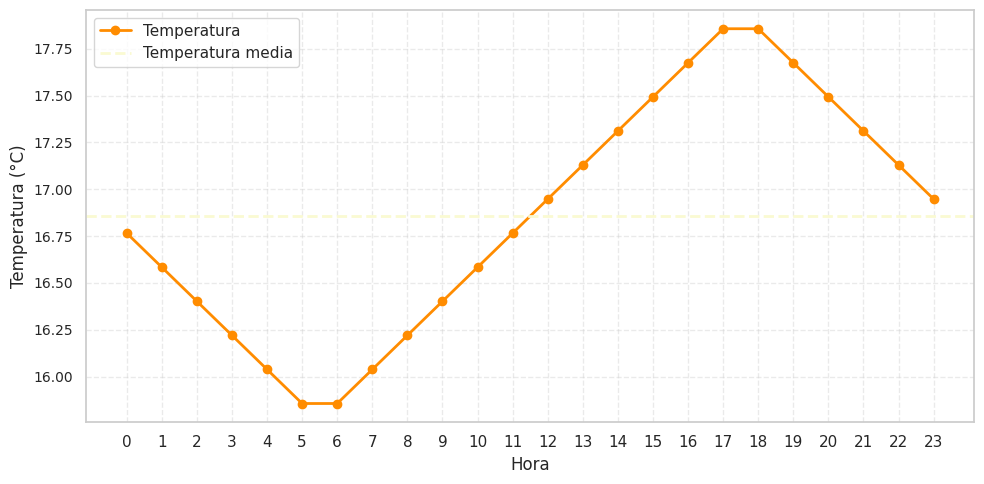

In [ ]:
sns.set_theme(style="whitegrid")

fecha_ejemplo = df[df['tmed_hourly'].notna()]['date'].iloc[3483]
df_dia = df[df['date'] == fecha_ejemplo]

plt.figure(figsize=(10, 5))
plt.plot(df_dia['hour'], df_dia['tmed_hourly'], marker='o', linewidth=2, color='#FF8C00', label='Temperatura')
plt.axhline(tmed_por_dia[fecha_ejemplo], color='#FAFAD2', linestyle='--', linewidth=2, label='Temperatura media')

plt.title(f'', fontsize=14)
plt.xlabel('Hora', fontsize=12)
plt.ylabel('Temperatura (°C)', fontsize=12)
plt.xticks(range(0, 24))
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.savefig("temperatura.png", dpi=300)
plt.show()

Para la precipitacion

In [ ]:
def distribute_precipitation(df):
    df_new = df.copy()
    daily_precip = df_new.groupby('date')['pmed_diaria'].mean()

    for date, precip in daily_precip.items():

        rows_to_update = df_new[df_new['date'] == date].index
        hourly_precip = precip / 24.0

        df_new.loc[rows_to_update, 'pmed_hourly'] = hourly_precip


    return df_new

df = distribute_precipitation(df)

In [ ]:
df.drop(columns=['tmed_diaria', 'pmed_diaria'], inplace=True)

Eliminamos columnas que no nos interesan.

In [ ]:
df.drop(columns=['Genéricas'], inplace=True)

Lo tenemos repetido

In [ ]:
df.drop(columns=['Saldo Marruecos', 'Saldo Francia', 'Saldo Portugal', 'Saldo Andorra'], inplace=True)

In [ ]:
df.drop(columns=['Saldo interconexiones'], inplace=True)

Eliminamos registro 2020.

In [ ]:
df = df.iloc[1:]

## Valores inconsistentes

Además vamos a visualizar las columnas con valores 0, estos indican que en aquel momento no se registró generación de energia.

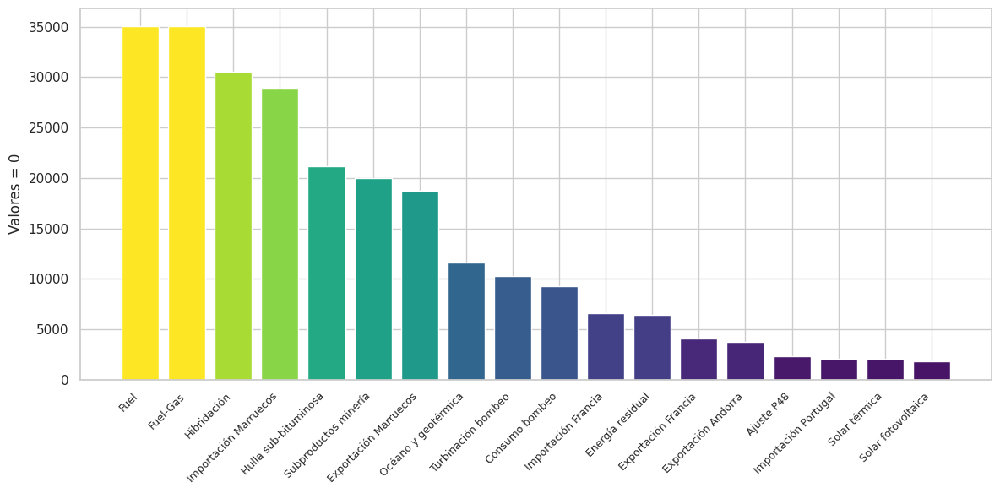

In [ ]:
ceros = (df == 0).sum(numeric_only=True)

excluir = ['DiaSemana', 'TipoDia', 'Estacion', 'HoraTrabajo', 'hour', 'HoraDia']
ceros = ceros.drop(labels=[col for col in excluir if col in ceros.index], errors='ignore')

ceros = ceros[ceros > 0]

ceros = ceros.sort_values(ascending=False).head(18)

plt.figure(figsize=(12, 6))
colors = plt.cm.viridis(ceros.values / ceros.values.max())
plt.bar(ceros.index, ceros.values, color=colors)
plt.ylabel("Valores = 0")
plt.title("")
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.subplots_adjust(bottom=0.3)
plt.tight_layout()
plt.show()

Observamos el % de ceros de las columnas

In [ ]:
porcentaje_ceros = (df == 0).sum(numeric_only=True) / len(df) * 100
porcentaje_ceros.sort_values(ascending=False).head(20)

,0
Fuel,99.974341
Fuel-Gas,99.974341
Hibridación,87.059159
Importación Marruecos,82.275125
TipoDia,69.585175
Hulla sub-bituminosa,60.427655
Subproductos minería,57.091946
HoraTrabajo,54.181041
Exportación Marruecos,53.502495
Océano y geotérmica,33.191732


Agrupamos en 'Renovables' y 'No Renovables'

In [ ]:
df['Otras renovables'] = (
    df['Otras renovables']
    + df.get('Residuos domésticos', 0)
    + df.get('Hibridación', 0)
    + df.get('Océano y geotérmica', 0)
    + df.get('Eólica terrestre', 0)
)


df['Otras no renovables'] = (
    df.get('Subproductos minería', 0)
    + df.get('Fuel', 0)
    + df.get('Derivados petróleo o carbón', 0)
    + df.get('Fuel-Gas', 0)
    + df.get('Hulla sub-bituminosa', 0)
    + df.get('Hulla antracita', 0)
    + df.get('Residuos varios', 0)
    + df.get('Residuos no renovables', 0)
)

columnas_a_eliminar = [
    'Residuos domésticos', 'Hibridación', 'Océano y geotérmica',
    'Subproductos minería', 'Fuel', 'Derivados petróleo o carbón',
    'Fuel-Gas', 'Hulla sub-bituminosa', 'Hulla antracita', 'Residuos varios', 'Residuos no renovables', 'Eólica terrestre'
]

df = df.drop(columns=[col for col in columnas_a_eliminar if col in df.columns])

IMPORTANTE COMPROBAR SI DEMANDA = 0

In [ ]:
demanda_ceros = (df['Demanda Peninsular'] == 0).sum()

if demanda_ceros == 0:
  print('Todo okey')

Todo okey


## Valores atípicos

Solo nos fijamos en los valores atípicos de la variable objetivo.

/tmp/ipython-input-668-1484818870.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-668-1484818870.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-668-1484818870.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-668-1484818870.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




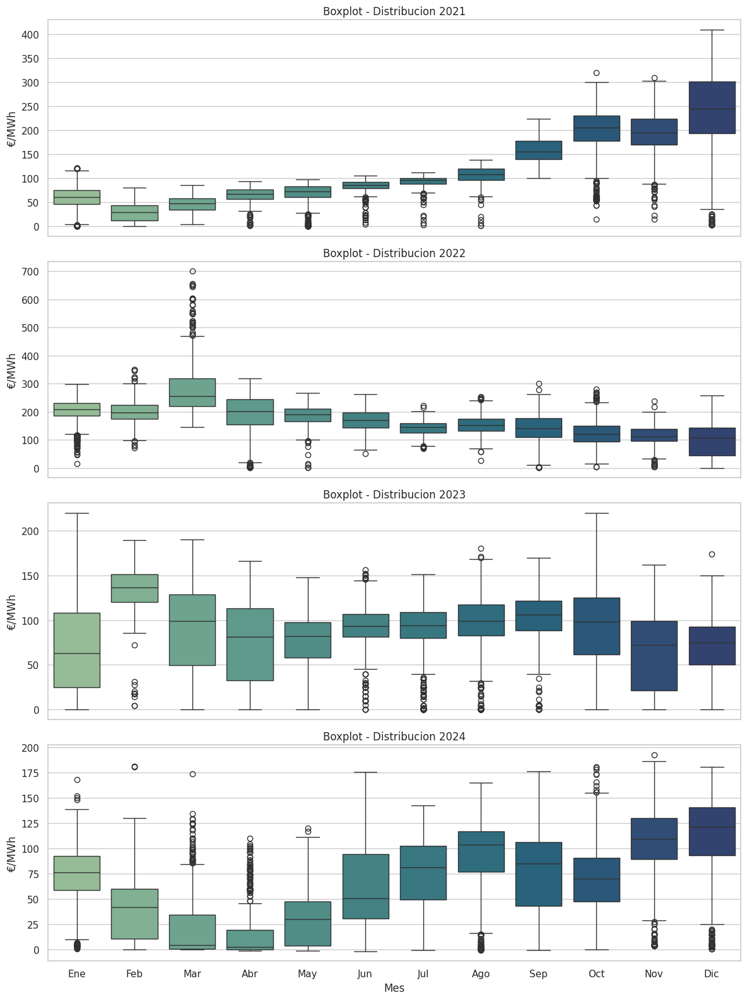

In [ ]:
df['datetime'] = pd.to_datetime(df['date']) + pd.to_timedelta(df['hour'], unit='h')
df['Año'] = df['datetime'].dt.year
df['Mes'] = df['datetime'].dt.month

meses_nombre = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun',
                'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
df['Mes_nombre'] = df['Mes'].apply(lambda x: meses_nombre[x-1])

años = sorted(df['Año'].unique())

fig, axes = plt.subplots(nrows=len(años), ncols=1, figsize=(12, 4 * len(años)), sharex=True)

for i, año in enumerate(años):
    ax = axes[i]
    data = df[df['Año'] == año]
    sns.boxplot(
        data=data,
        x='Mes_nombre',
        y='SPOT_ESP',
        ax=ax,
        palette='crest',
        showfliers=True
    )
    ax.set_title(f"Boxplot - Distribucion {año}")
    ax.set_ylabel("€/MWh")
    ax.set_xlabel("Mes")

axes[-1].set_xlabel("Mes")
plt.tight_layout()
plt.show()

In [ ]:
df.drop(columns=['Mes_nombre'], inplace=True)

# Análisis previo

## Disitribuciones - Análisis general de los datos



###¿Cómo influye el calendario al precio SPOT?

Calculamos los cuartiles para la representacion

In [ ]:
df['SPOT_ESP'] = pd.to_numeric(df['SPOT_ESP'], errors='coerce')
spot = df['SPOT_ESP'].dropna()

cuartiles = spot.quantile([0.25, 0.50, 0.75]).rename({
    0.25: '1er cuartil (Q1)',
    0.50: 'Mediana (Q2)',
    0.75: '3er cuartil (Q3)'
})

cuartiles

,SPOT_ESP
1er cuartil (Q1),60.05
Mediana (Q2),98.59
3er cuartil (Q3),144.66


Dia semana vs precio

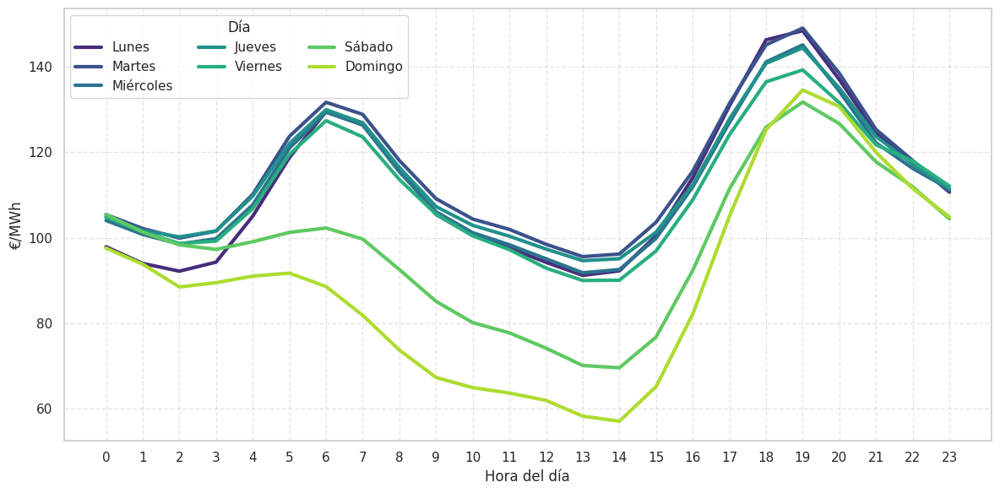

In [ ]:
colores = sns.color_palette("viridis", 7)
plt.figure(figsize=(12, 6))
for i in range(7):
    media = df[df['DiaSemana'] == i].groupby('hour')['SPOT_ESP'].mean()
    plt.plot(
        media.index,
        media.values,
        label=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'][i],
        linewidth=3,
        color=colores[i]
    )
plt.title("", fontsize=14, weight='bold')
plt.xlabel("Hora del día")
plt.ylabel("€/MWh")
plt.xticks(range(24))
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title="Día", ncol=3)
plt.tight_layout()
plt.show()

Tipo de dia vs precio

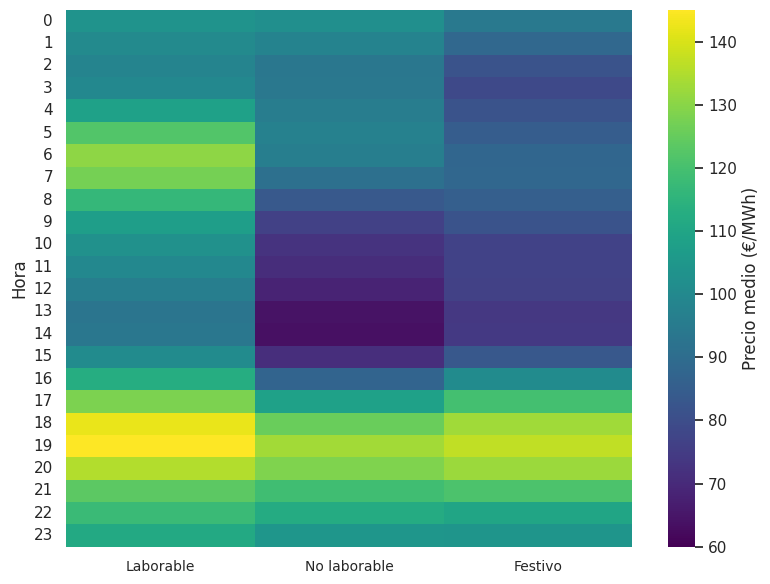

In [ ]:
df['hour'] = df['hour'].astype(int)

df_plot = df[['TipoDia', 'hour', 'SPOT_ESP']].dropna()
pivot_lab = df_plot.pivot_table(
    index='hour',
    columns='TipoDia',
    values='SPOT_ESP',
    aggfunc='mean',
    observed=False
)

precio_min = 60
precio_max = 145

plt.figure(figsize=(8, 6))
cmap = sns.color_palette("viridis", as_cmap=True)

ax = sns.heatmap(
    pivot_lab,
    cmap=cmap,
    vmin=precio_min,
    vmax=precio_max,
    cbar_kws={'label': 'Precio medio (€/MWh)'},
    linewidths=0
)


ax.set_xticklabels(['Laborable', 'No laborable', 'Festivo'], rotation=0, ha='center', fontsize=10)

ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
ax.set_yticks(ax.get_yticks())
ax.set_yticklabels([str(int(tick.get_text())) for tick in ax.get_yticklabels()])
plt.title("", fontsize=14, weight='bold')
plt.xlabel("")
plt.ylabel("Hora")
plt.tight_layout()
plt.show()

Mes vs precio

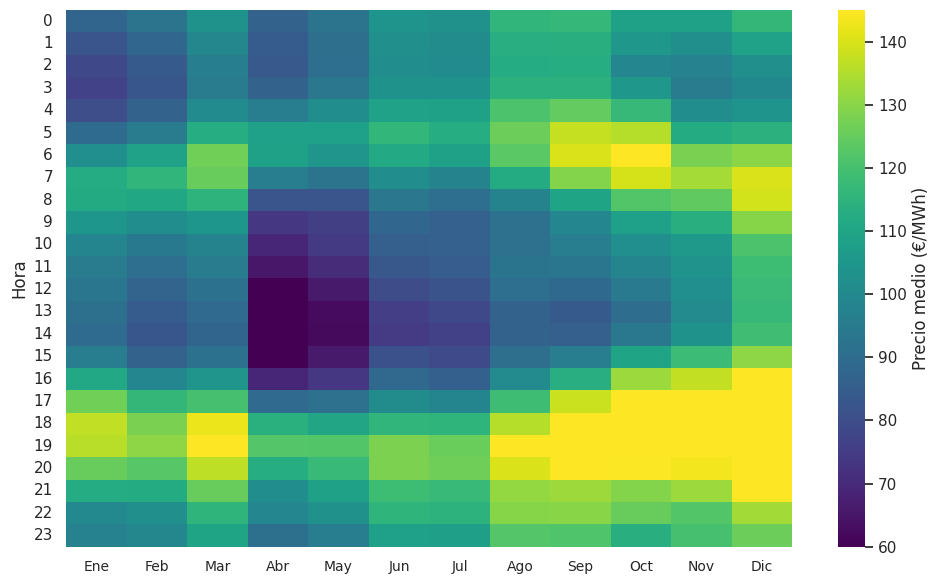

In [ ]:
df['Mes'] = pd.to_datetime(df['date']).dt.month
df['Mes'] = df['Mes'].astype(int).astype('category')

df_plot = df[['Mes', 'hour', 'SPOT_ESP']].dropna()
pivot_mes = df_plot.pivot_table(
    index='hour',
    columns='Mes',
    values='SPOT_ESP',
    aggfunc='mean',
    observed=False
)

precio_min = 60
precio_max = 145

plt.figure(figsize=(10, 6))
cmap = sns.color_palette("viridis", as_cmap=True)

ax = sns.heatmap(
    pivot_mes,
    cmap=cmap,
    vmin=precio_min,
    vmax=precio_max,
    cbar_kws={'label': 'Precio medio (€/MWh)'},
    linewidths=0,
    linecolor='white'
)


meses_str = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun',
             'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
ax.set_xticklabels(meses_str, rotation=0, ha='center', fontsize=10)
plt.title("", fontsize=14, weight='bold')
plt.xlabel("")
plt.ylabel("Hora")
plt.tight_layout()
plt.show()

In [ ]:
fecha_objetivo = df['date'].iloc[17447]
df_dia = df[df['date'] == fecha_objetivo].copy()

renovables = [
    'Solar fotovoltaica',
    'Solar térmica',
    'Eólica',
    'Hidráulica',
    'Hidráulica no UGH',
    'Biomasa',
    'Turbinación bombeo',
    'Otras renovables', 'Biogás',
]

no_renovables = [
    'Nuclear',
    'Ciclo combinado',
    'Carbón',
    'Cogeneración',
    'Gas Natural Cogeneración',
    'Otras no renovables', 'Energía residual',
]


df_dia['renovable'] = df_dia[renovables].sum(axis=1)
df_dia['no_renovable'] = df_dia[no_renovables].sum(axis=1)


grouped = df_dia.groupby('hour')[['renovable', 'no_renovable', 'SPOT_ESP']].sum().reset_index()


fig = make_subplots(specs=[[{"secondary_y": True}]])


fig.add_trace(go.Bar(
    x=grouped['hour'],
    y=grouped['renovable'],
    name='Renovables',
    marker=dict(color='#8FBC8F'),
    offsetgroup='gen'
), secondary_y=False)

fig.add_trace(go.Bar(
    x=grouped['hour'],
    y=grouped['no_renovable'],
    name='No Renovables',
    marker=dict(color='#2F4F4F'),
    offsetgroup='gen',
    base=grouped['renovable']
), secondary_y=False)

fig.add_trace(go.Scatter(
    x=grouped['hour'],
    y=grouped['SPOT_ESP'],
    name='Precio SPOT',
    mode='lines+markers',
    line=dict(color='#FFA500', width=3)
), secondary_y=True)

# 6) Layout
fig.update_layout(
    title=f'Generación Renovable vs No Renovable y Precio SPOT — {fecha_objetivo}',
    barmode='stack',
    xaxis=dict(title='Hora'),
    yaxis=dict(title='MWh'),
    yaxis2=dict(title='Precio SPOT (€/MWh)', overlaying='y', side='right'),
    legend=dict(x=1.02, y=1),
    width=1000,
    height=500
)

fig.show()

In [ ]:
colores_custom = {
    'Hidráulica':               '#4fc3f7',
    'Hidráulica no UGH':        '#AFEEEE',
    'Turbinación bombeo':       '#0288d1',
    'Nuclear':                  '#ce93d8',
    'Ciclo combinado':          '#607d8b',
    'Gas Natural Cogeneración': '#bcaaa4',
    'Solar fotovoltaica':       '#fff176',
    'Solar térmica':            '#fff176',
    'Eólica':                   '#a5d6a7',
    'Biomasa':                  '#8bc34a',
    'Carbón':                   '#8d6e63',
    'Cogeneración':             '#ffb74d',
    'Residuos no renovables':   '#191970',
    'Otras renovables':         '#6B8E23',
    'Consumo bombeo':           '#d84315',
    'Exportación Total':        '#FDF5E6',
    'Importación Total':        '#F5FFFA',

}

fecha_objetivo = df['date'].iloc[22237]
df_dia = df[df['date'] == fecha_objetivo].copy()

pos_techs = [c for c in [
    'Hidráulica', 'Hidráulica no UGH', 'Turbinación bombeo', 'Nuclear',
    'Ciclo combinado', 'Gas Natural Cogeneración', 'Solar fotovoltaica',
    'Solar térmica', 'Biomasa', 'Carbón', 'Eólica', 'Cogeneración',
    'Residuos no renovables', 'Otras renovables',
    'Importación Total',  'Otras no renovables',
] if c in df.columns]

neg_techs = [c for c in [
    'Consumo bombeo', 'Exportación Total'
] if c in df.columns]

columnas_extra = ['SPOT_ESP', 'PVPC', 'Demanda Peninsular', 'Generación P48 total']
grouped = (
    df_dia
    .groupby('hour')[pos_techs + neg_techs + columnas_extra]
    .sum()
    .reset_index()
)


fig = make_subplots(specs=[[{"secondary_y": True}]])


for tech in pos_techs:
    fig.add_trace(
        go.Bar(
            x=grouped['hour'],
            y=grouped[tech],
            name=tech,
            marker=dict(color=colores_custom.get(tech, '#888888')),
            offsetgroup='pos'
        ),
        secondary_y=False
    )


for tech in neg_techs:
    fig.add_trace(
        go.Bar(
            x=grouped['hour'],
            y=grouped[tech],
            name=tech,
            marker=dict(color=colores_custom.get(tech, '#888888'))
        ),
        secondary_y=False
    )


fig.add_trace(
    go.Scatter(
        x=grouped['hour'],
        y=grouped['Demanda Peninsular'],
        name='Demanda',
        mode='lines+markers',
        line=dict(color='black', width=2, dash='dot')
    ),
    secondary_y=False
)


fig.add_trace(
    go.Scatter(
        x=grouped['hour'],
        y=grouped['SPOT_ESP'],
        name='Precio SPOT',
        mode='lines',
        line=dict(color='red', width=2)
    ),
    secondary_y=True
)
fig.add_trace(
    go.Scatter(
        x=grouped['hour'],
        y=grouped['Generación P48 total'],
        name='Generación total',
        mode='lines',
        line=dict(color='blue', width=2, dash='solid')
    ),
    secondary_y=False
)

fig.update_layout(
    title=f'Generación, Demanda y Precio spot — {fecha_objetivo}',
    barmode='relative',
    xaxis=dict(title='Hora del día'),
    yaxis=dict(title='Generación / Demanda (MWh)'),
    yaxis2=dict(
        title='Precio (€/MWh)',
        overlaying='y',
        side='right',
        dtick=20
    ),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=-0.25,
        xanchor="left",
        x=0,
        traceorder='normal',
        font=dict(size=10),
        title=None
    ),
    margin=dict(b=200),
    height=700,
    width=1100
)

fig.show()

### ¿Qué tecnologías generan más a lo largo del año?

In [ ]:
tecnologias_generacion = [
    'Hidráulica', 'Hidráulica no UGH', 'Turbinación bombeo',
    'Nuclear', 'Ciclo combinado', 'Gas Natural Cogeneración',
    'Solar fotovoltaica', 'Solar térmica', 'Biomasa',
    'Carbón', 'Eólica', 'Cogeneración','Otras renovables',
    'Otras no renovables',
]

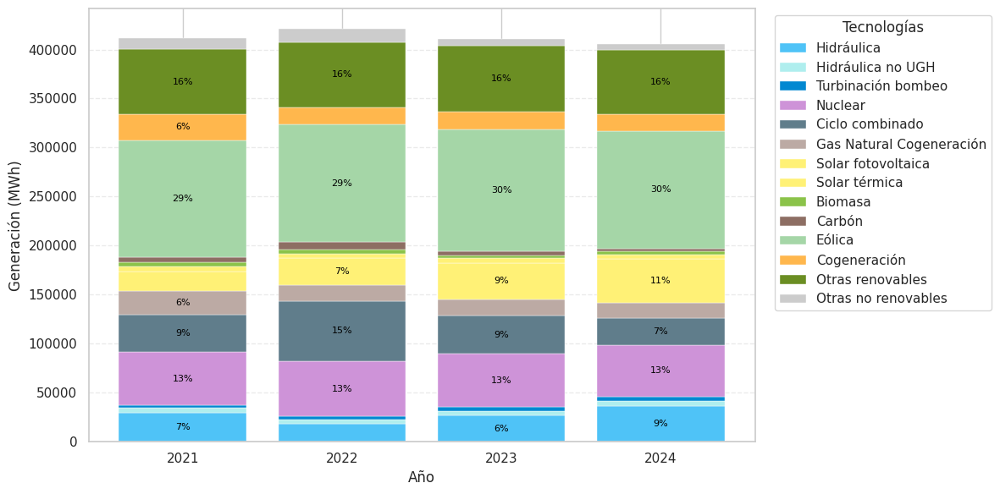

In [ ]:
generacion_anual = df.groupby('Año')[tecnologias_generacion].sum() / 1_000  # en kMWh

colores = [colores_custom.get(col, '#cccccc') for col in generacion_anual.columns]

fig, ax = plt.subplots(figsize=(12, 6))

bottoms = [0] * len(generacion_anual)
years = generacion_anual.index.tolist()

for i, tech in enumerate(generacion_anual.columns):
    valores = generacion_anual[tech].values
    ax.bar(
        years,
        valores,
        bottom=bottoms,
        label=tech,
        color=colores[i],
        edgecolor='white',
        linewidth=0.3
    )
    for j, v in enumerate(valores):
        total = generacion_anual.iloc[j].sum()
        pct = v / total * 100
        if pct > 5:
            ax.text(
                years[j],
                bottoms[j] + v / 2,
                f'{pct:.0f}%',
                ha='center',
                va='center',
                fontsize=8,
                color='black'
            )
    bottoms = [sum(x) for x in zip(bottoms, valores)]

ax.set_ylabel('Generación (MWh)')
ax.set_xlabel('Año')
ax.set_title((''), fontsize=14, weight='bold')
ax.set_xticks(years)
ax.grid(axis='y', linestyle='--', alpha=0.4)
ax.legend(title='Tecnologías', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

<Figure size 1400x800 with 0 Axes>

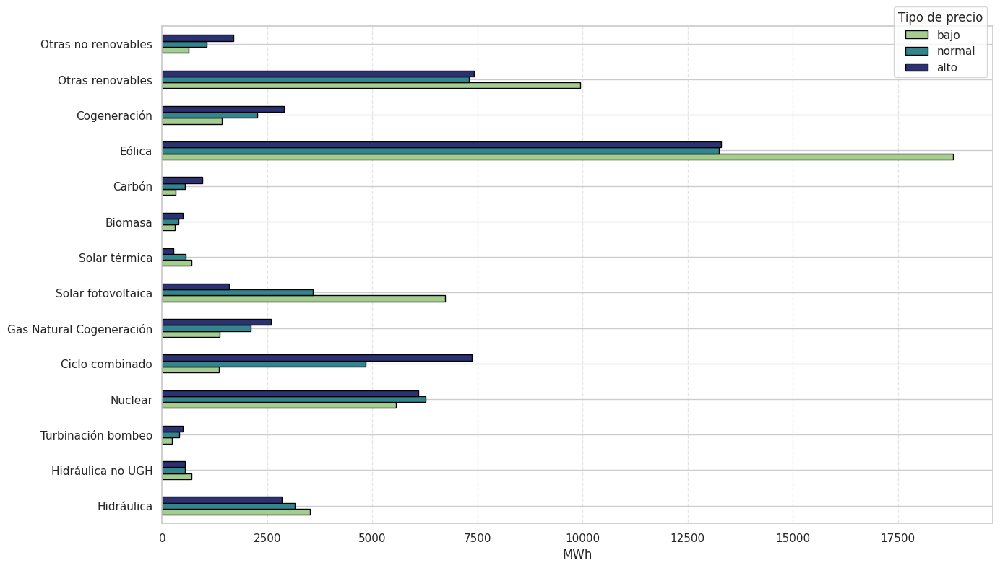

In [ ]:
q10 = df['SPOT_ESP'].quantile(0.10)
q90 = df['SPOT_ESP'].quantile(0.90)

df['tipo_precio'] = 'normal'
df.loc[df['SPOT_ESP'] > q90, 'tipo_precio'] = 'alto'
df.loc[df['SPOT_ESP'] < q10, 'tipo_precio'] = 'bajo'


tecnologias = [
    'Hidráulica', 'Hidráulica no UGH', 'Turbinación bombeo',
    'Nuclear', 'Ciclo combinado', 'Gas Natural Cogeneración',
    'Solar fotovoltaica', 'Solar térmica', 'Biomasa',
    'Carbón', 'Eólica', 'Cogeneración','Otras renovables',
    'Otras no renovables',
]


comparacion = df.groupby('tipo_precio')[tecnologias].mean().T
comparacion = comparacion.reindex(columns=['bajo', 'normal', 'alto'])

plt.figure(figsize=(14, 8))
ax = comparacion.plot(
    kind='barh',
    colormap='crest',
    edgecolor='black',
    figsize=(14, 8)
)

plt.title("", fontsize=15, weight='bold')
plt.xlabel("MWh", fontsize=12)
plt.ylabel("", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.legend(
    title="Tipo de precio",
    loc='upper right',
    bbox_to_anchor=(1, 1.05)
)

plt.tight_layout()
plt.show()

## Estudiar la variable objetivo

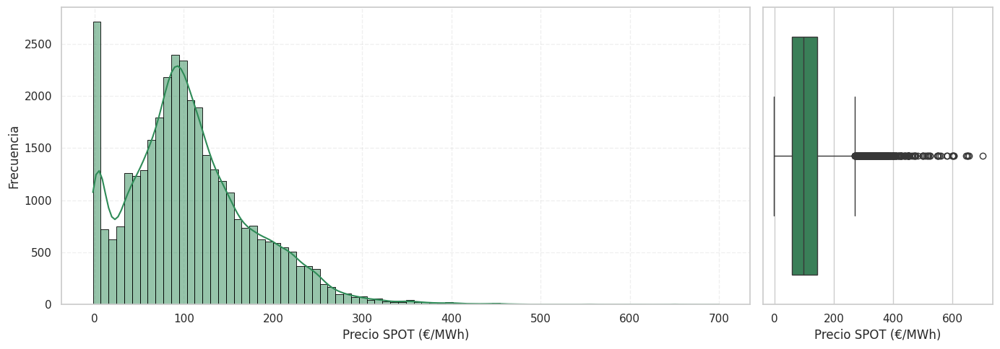

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5), gridspec_kw={'width_ratios': [3, 1]})

sns.histplot(df['SPOT_ESP'], bins=80, kde=True, color='seagreen', edgecolor='black', ax=axes[0])
axes[0].set_title("", fontsize=14, weight='bold')
axes[0].set_xlabel("Precio SPOT (€/MWh)")
axes[0].set_ylabel("Frecuencia")
axes[0].grid(True, linestyle='--', alpha=0.3)

sns.boxplot(x=df['SPOT_ESP'], color='seagreen', ax=axes[1], orient='h')
axes[1].set_title("", fontsize=14, weight='bold')
axes[1].set_xlabel("Precio SPOT (€/MWh)")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

Coeficiente de Pearson:

Sirve para determinar el grado y la dirección de la asimetría en una distribución de datos:

* Si ap1 > 0: La distribución es asimétrica positiva (o hacia la derecha). Esto significa que la "cola" de la distribución es más larga hacia los valores más altos. La media es mayor que la moda.
* Si ap1 < 0: La distribución es asimétrica negativa (o hacia la izquierda). Esto significa que la "cola" de la distribución es más larga hacia los valores más bajos. La media es menor que la moda.
* Si ap1 ≈ 0: La distribución es aproximadamente simétrica. La media, la mediana y la moda son aproximadamente iguales.

In [ ]:
x = df['SPOT_ESP'].dropna()
media = x.mean()
moda = x.mode().iloc[0]
std = x.std()

ap1 = (media - moda) / std
ap1

np.float64(1.5094316887273793)

 La distribución es asimétrica positiva (o hacia la derecha)

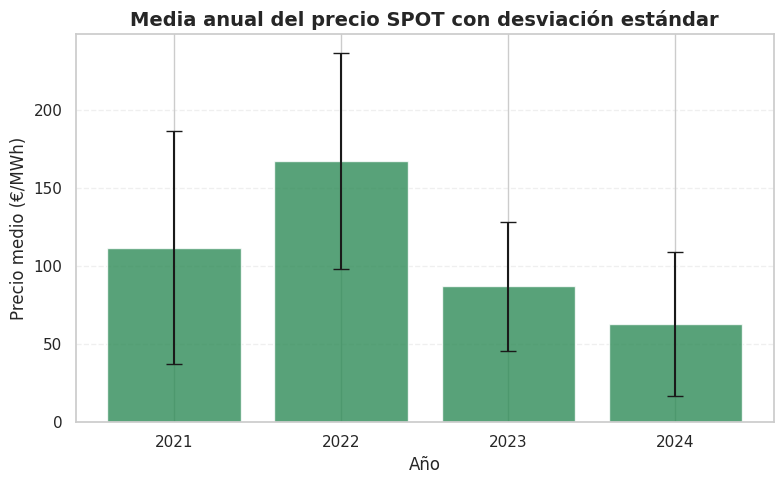

In [ ]:
resumen = df.groupby('Año')['SPOT_ESP'].agg(['mean', 'std'])

plt.figure(figsize=(8, 5))
plt.bar(
    resumen.index.astype(str),
    resumen['mean'],
    yerr=resumen['std'],
    capsize=6,
    color='seagreen',
    alpha=0.8
)

plt.title("Media anual del precio SPOT con desviación estándar", fontsize=14, weight='bold')
plt.xlabel("Año")
plt.ylabel("Precio medio (€/MWh)")
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
df['date'] = pd.to_datetime(df['date'])

df['Año'] = df['date'].dt.year
resumen = df.groupby('Año')['SPOT_ESP'].agg(['mean', 'std'])

La prueba ADF, o Prueba Aumentada de Dickey-Fuller, es una herramienta estadística utilizada para determinar si una serie temporal es estacionaria o no.

In [ ]:
resultado_adf = adfuller(df['SPOT_ESP'].dropna())
estadistico_adf = resultado_adf[0]
p_valor = resultado_adf[1]

In [ ]:
p_valor

np.float64(6.4642518602819775e-09)

In [ ]:
estadistico_adf

np.float64(-6.608533299257498)

In [ ]:
df_sin_duplicados = df.drop_duplicates(subset='datetime')

serie = df_sin_duplicados.set_index('datetime')['SPOT_ESP'].asfreq('h')

Descomposicion de la serie

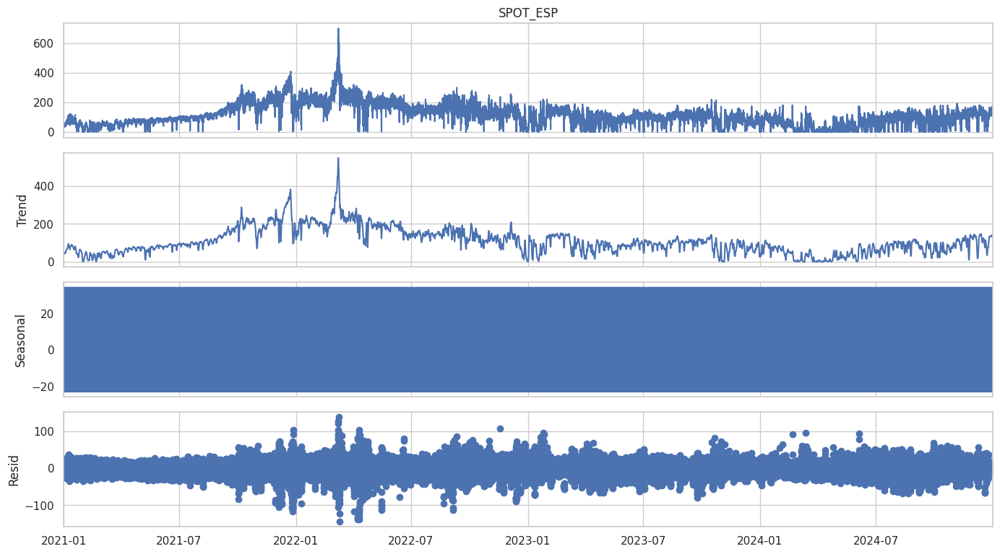

In [ ]:
descomposicion = seasonal_decompose(serie, model='additive', period=24)

fig = descomposicion.plot()
fig.set_size_inches(14, 8)
fig.suptitle("", fontsize=16, weight='bold')
plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.show()

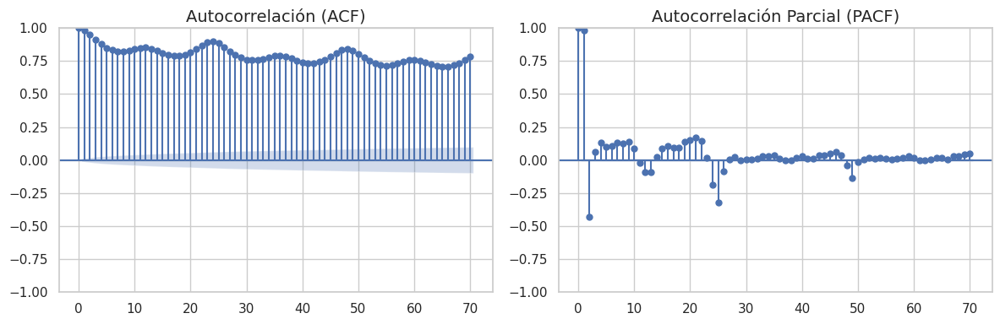

In [ ]:
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.groupby('datetime', as_index=False).mean(numeric_only=True)
serie = df.set_index('datetime')['SPOT_ESP'].asfreq('h')

serie = serie.dropna()

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
plot_acf(serie, ax=axes[0], lags=70)
axes[0].set_title('Autocorrelación (ACF)', fontsize=14)

plot_pacf(serie, ax=axes[1], lags=70, method='ywm')
axes[1].set_title('Autocorrelación Parcial (PACF)', fontsize=14,)

plt.subplots_adjust(wspace=0.3)
plt.tight_layout()
plt.show()

In [ ]:
resultado_adf = adfuller(serie.dropna())
print(f"Estadístico ADF: {resultado_adf[0]:.4f}")
print(f"p-valor: {resultado_adf[1]:.4f}")

resultado_kpss = kpss(serie.dropna(), regression='c', nlags='auto')
print(f"Estadístico KPSS: {resultado_kpss[0]:.4f}")
print(f"p-valor: {resultado_kpss[1]:.4f}")

Estadístico ADF: -6.6160
p-valor: 0.0000
Estadístico KPSS: 7.9010
p-valor: 0.0100


/tmp/ipython-input-689-1608007258.py:5: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




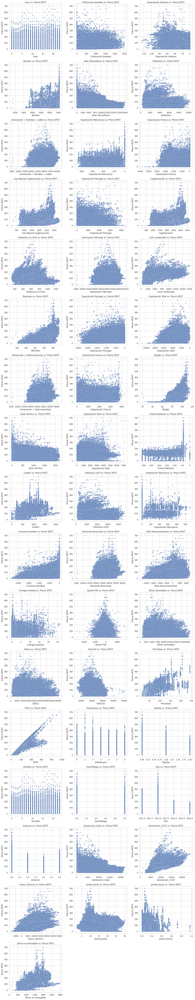

In [ ]:
variables_numericas = df.select_dtypes(include=['float64', 'int64']).columns.tolist()


variables_numericas = [var for var in variables_numericas if var not in ['SPOT_ESP', 'SPOT_FR', 'SPOT_POR']]

plt.figure(figsize=(16, 5 * len(variables_numericas) // 3))

for i, variable in enumerate(variables_numericas, 1):
    plt.subplot(len(variables_numericas) // 3 + 1, 3, i)
    sns.scatterplot(data=df, x=variable, y='SPOT_ESP', alpha=0.5)
    plt.title(f'{variable} vs. Precio SPOT')
    plt.xlabel(variable)
    plt.ylabel('Precio SPOT')

plt.tight_layout()
plt.show()

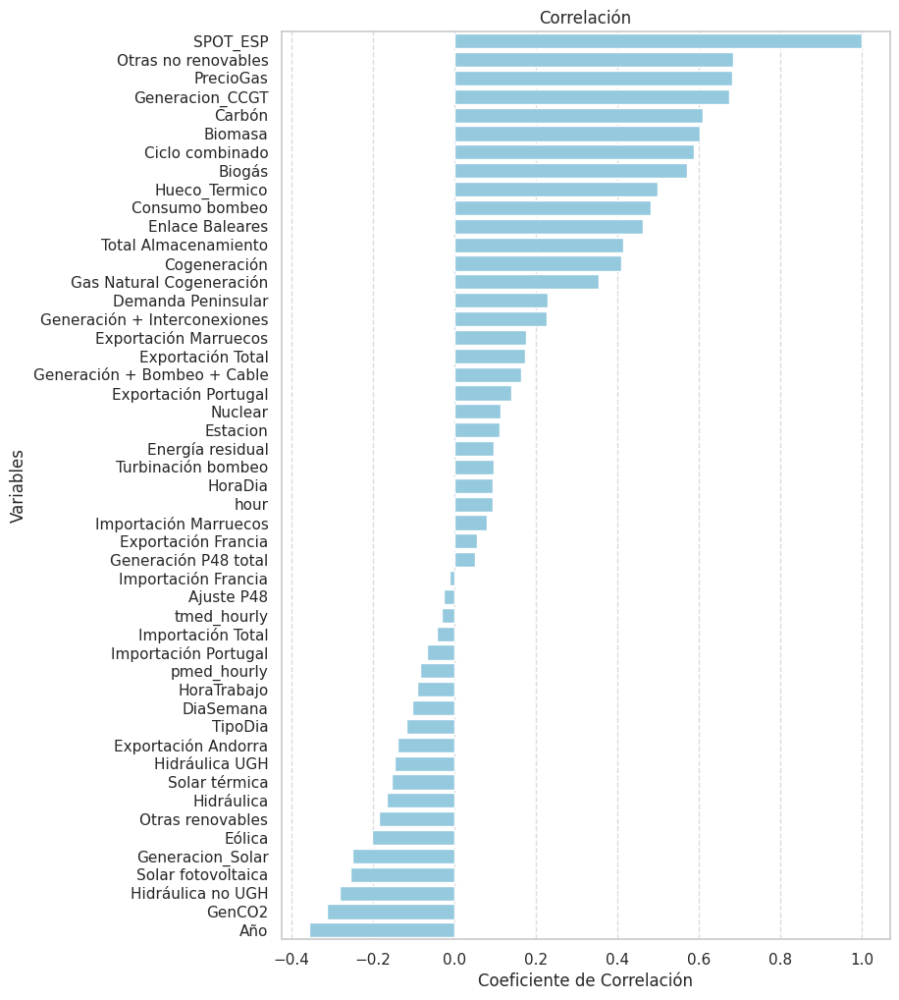

In [ ]:
datos_filtrados = df.copy()

columnas_a_excluir = ['datetime', 'date', 'SPOT_FR', 'SPOT_POR', 'PVPC']
datos_filtrados = datos_filtrados.drop(columns=columnas_a_excluir, errors='ignore')

correlacion = datos_filtrados.corr()

correlacion_precio = correlacion['SPOT_ESP'].sort_values(ascending=False)

plt.figure(figsize=(8, 12))
sns.barplot(x=correlacion_precio.values, y=correlacion_precio.index, color='skyblue')
plt.title('Correlación')
plt.xlabel('Coeficiente de Correlación')
plt.ylabel('Variables')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

## Correlaciones

### Por día

Print correlaciones fuertes

In [ ]:
df = df.drop(columns=['HoraDia'])
df['date'] = pd.to_datetime(df['datetime']).dt.date

df_dia = df.groupby('date').mean(numeric_only=True)

corr = df_dia.corr()

mask = np.triu(np.ones(corr.shape), k=1).astype(bool)
corr_pairs = corr.where(mask).stack().reset_index()
corr_pairs.columns = ['Variable 1', 'Variable 2', 'Correlación']

threshold = 0.75
corr_fuertes = corr_pairs[corr_pairs['Correlación'].abs() > threshold]

corr_fuertes = corr_fuertes.sort_values(by='Correlación', ascending=True)

print(corr_fuertes)

                        Variable 1                    Variable 2  Correlación
41                            hour                   HoraTrabajo    -1.000000
1018                Consumo bombeo                 Hueco_Termico     0.762347
1265               Generacion_CCGT                 Hueco_Termico     0.783596
863                  Solar térmica              Generacion_Solar     0.787101
546              Hidráulica no UGH                Hidráulica UGH     0.801558
382            Exportación Francia           Importación Francia     0.808457
296    Generación + Bombeo + Cable  Generación + Interconexiones     0.808467
306    Generación + Bombeo + Cable            Demanda Peninsular     0.815508
246                     Hidráulica             Hidráulica no UGH     0.847387
1158                       SPOT_FR                          PVPC     0.863844
781            Importación Francia             Importación Total     0.868585
1197                     PrecioGas                          PVPC

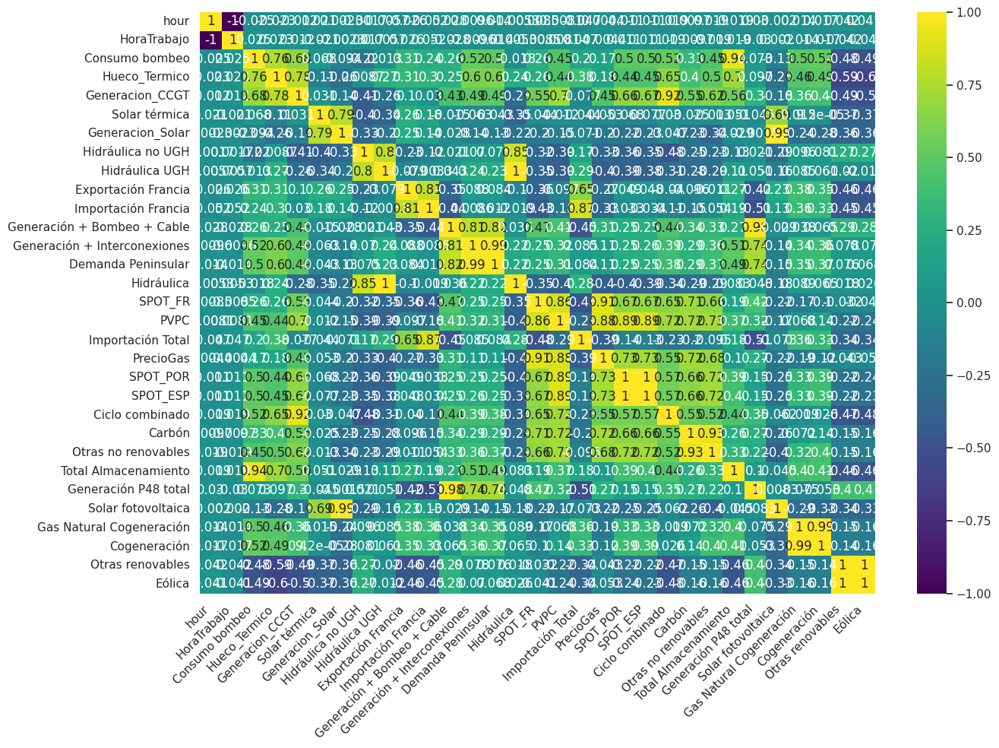

In [ ]:
vars_interes = pd.unique(corr_fuertes[['Variable 1', 'Variable 2']].values.ravel())

sub_corr = corr.loc[vars_interes, vars_interes]

plt.figure(figsize=(14, 10))
sns.heatmap(sub_corr, annot=True, cmap="viridis", center=0)
plt.title("", fontsize=14, weight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Por mes


In [ ]:
df['Año'] = pd.to_datetime(df['datetime']).dt.year
df['Mes'] = pd.to_datetime(df['datetime']).dt.month
df_mes = df.groupby(['Año', 'Mes']).mean(numeric_only=True)

Corerlaciones fuertes

In [ ]:
corr_mes = df_mes.corr()
mask = np.triu(np.ones(corr_mes.shape), k=1).astype(bool)
corr_pairs_mes = corr_mes.where(mask).stack().reset_index()
corr_pairs_mes.columns = ['Variable 1', 'Variable 2', 'Correlación']

threshold = 0.70
corr_fuertes_mes = corr_pairs_mes[corr_pairs_mes['Correlación'].abs() > threshold]

corr_fuertes_mes = corr_fuertes_mes.sort_values(by='Correlación', ascending=True)

print(corr_fuertes_mes)

                        Variable 1            Variable 2  Correlación
41                            hour           HoraTrabajo    -1.000000
74              Turbinación bombeo        Consumo bombeo    -0.938118
76              Turbinación bombeo  Total Almacenamiento    -0.839796
1086              Otras renovables           tmed_hourly    -0.785194
1102                        Eólica           tmed_hourly    -0.780362
...                            ...                   ...          ...
406       Gas Natural Cogeneración          Cogeneración     0.994154
738   Generación + Interconexiones    Demanda Peninsular     0.997448
254                     Hidráulica        Hidráulica UGH     0.997981
1072              Otras renovables                Eólica     0.998490
1106                      SPOT_ESP              SPOT_POR     0.999871

[77 rows x 3 columns]


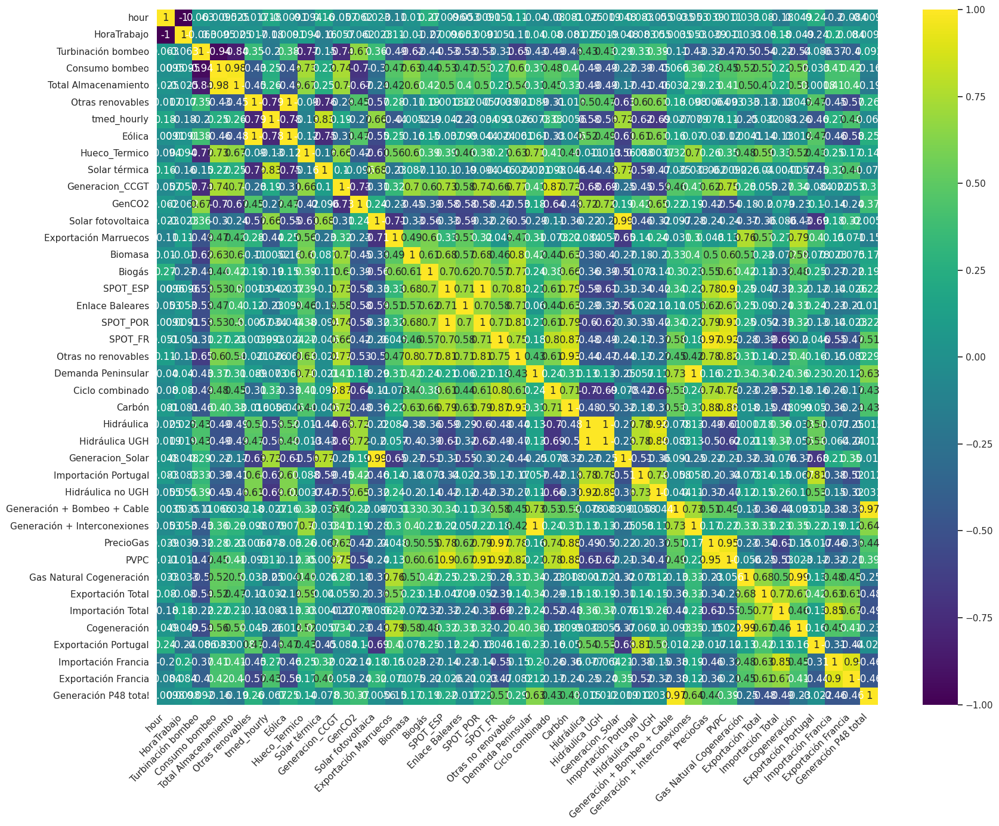

In [ ]:
vars_interes_mes = pd.unique(corr_fuertes_mes[['Variable 1', 'Variable 2']].values.ravel())
sub_corr_mes = corr_mes.loc[vars_interes_mes, vars_interes_mes]

plt.figure(figsize=(18, 14))
sns.heatmap(sub_corr_mes, annot=True, cmap="viridis", center=0)
plt.title("", fontsize=14, weight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Por año

In [ ]:
df['Año'] = pd.to_datetime(df['datetime']).dt.year
df_anual = df.groupby('Año').mean(numeric_only=True)

In [ ]:
corr_anual = df_anual.corr()

In [ ]:
mask = np.triu(np.ones(corr_anual.shape), k=1).astype(bool)
corr_pairs_anual = corr_anual.where(mask).stack().reset_index()
corr_pairs_anual.columns = ['Variable 1', 'Variable 2', 'Correlación']

threshold = 0.70
corr_fuertes_anual = corr_pairs_anual[corr_pairs_anual['Correlación'].abs() > threshold]

corr_fuertes_anual = corr_fuertes_anual.sort_values(by='Correlación', ascending=True)

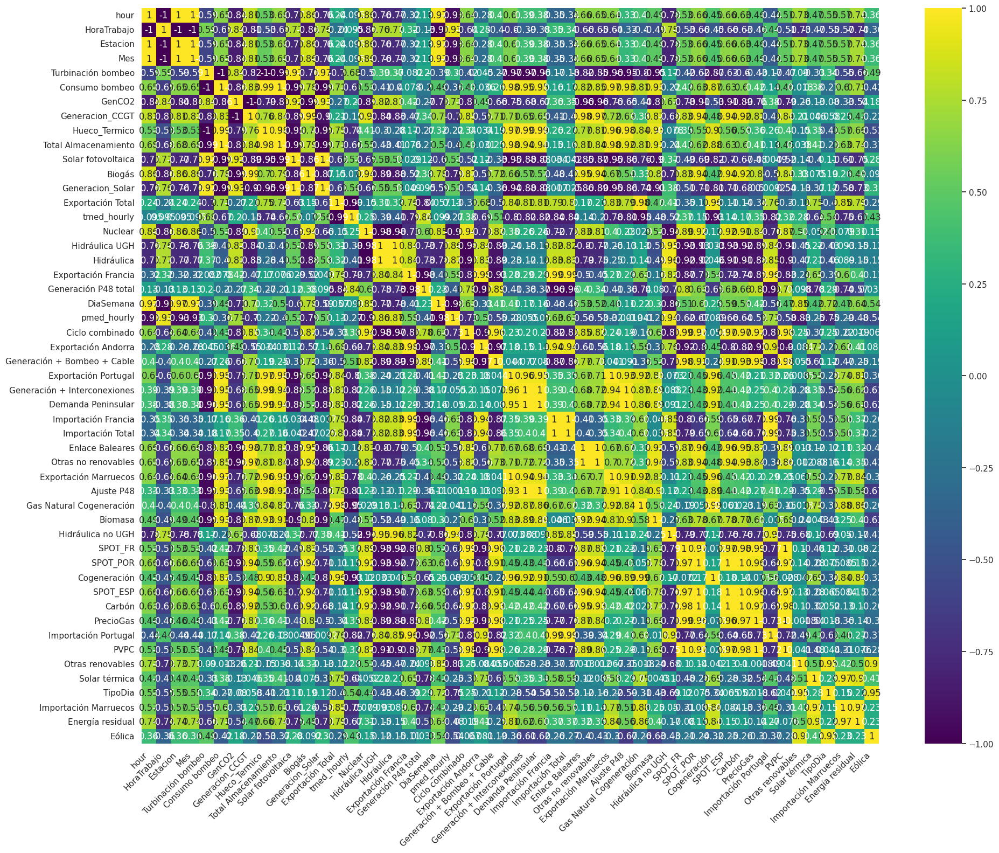

In [ ]:
vars_interes_anual = pd.unique(corr_fuertes_anual[['Variable 1', 'Variable 2']].values.ravel())

sub_corr_anual = corr_anual.loc[vars_interes_anual, vars_interes_anual]

plt.figure(figsize=(20, 16))
sns.heatmap(sub_corr_anual, annot=True, cmap="viridis", center=0)
plt.title("", fontsize=14, weight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Correlaciones aun más fuertes

In [ ]:
print(corr_fuertes_anual[corr_fuertes_anual['Correlación'].abs() <= 0.95].to_string())

                        Variable 1                    Variable 2  Correlación
451       Gas Natural Cogeneración                   tmed_hourly    -0.949414
1255              Generacion_Solar                 Hueco_Termico    -0.949216
205             Solar fotovoltaica          Exportación Portugal    -0.949056
235             Solar fotovoltaica                 Hueco_Termico    -0.948687
365          Exportación Marruecos              Generacion_Solar    -0.946960
63              Turbinación bombeo                       Biomasa    -0.945973
707           Exportación Portugal              Generacion_Solar    -0.943512
155                        Nuclear             Hidráulica no UGH    -0.936374
959                 Hidráulica UGH                       SPOT_FR    -0.934140
1251                      Estacion                   pmed_hourly    -0.930321
47                            hour                   pmed_hourly    -0.930321
1273                   pmed_hourly                           Mes

### Ver distribucion de las variables

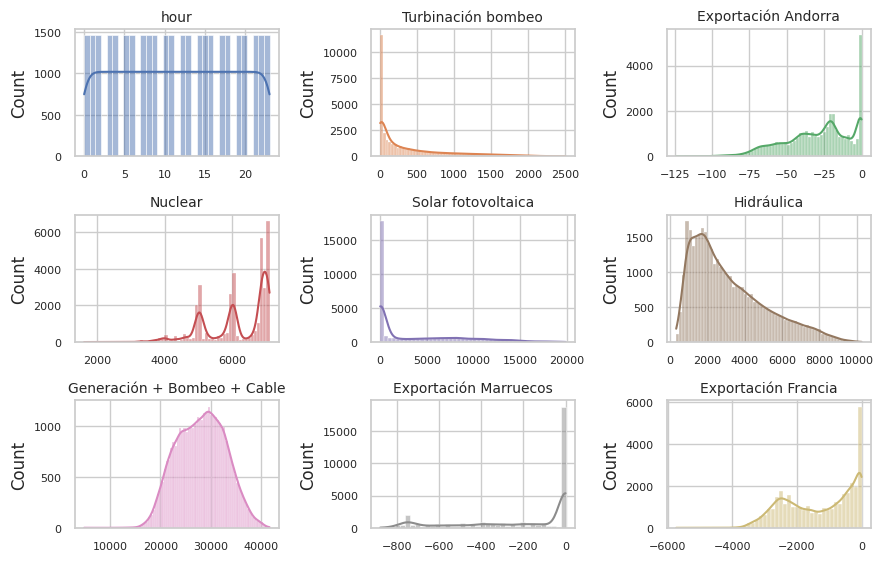

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 6))
axes = axes.flat
columnas_numeric = df.select_dtypes(include=np.number).columns

for i, colum in enumerate(columnas_numeric[:len(axes)]):
    sns.histplot(
        data    = df,
        x       = colum,
        stat    = "count",
        kde     = True,
        color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 10)
    axes[i].tick_params(labelsize = 8)
    axes[i].set_xlabel("")


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('', fontsize = 12);

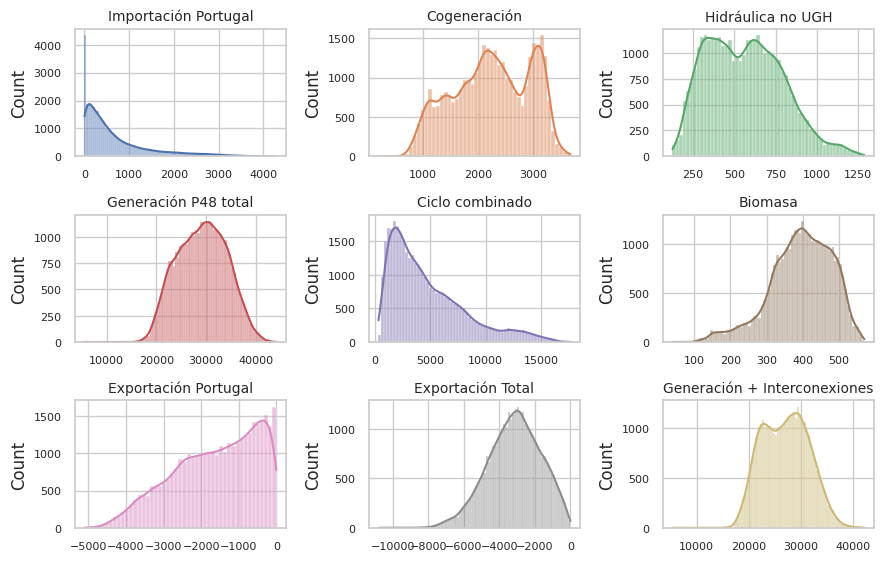

In [ ]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 6))
axes = axes.flat
columnas_numeric_next_9 = columnas_numeric[10:19]

for i, colum in enumerate(columnas_numeric_next_9[:len(axes)]):
    sns.histplot(
        data    = df,
        x       = colum,
        stat    = "count",
        kde     = True,
        color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 10)
    axes[i].tick_params(labelsize = 8)
    axes[i].set_xlabel("")


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('', fontsize = 12);

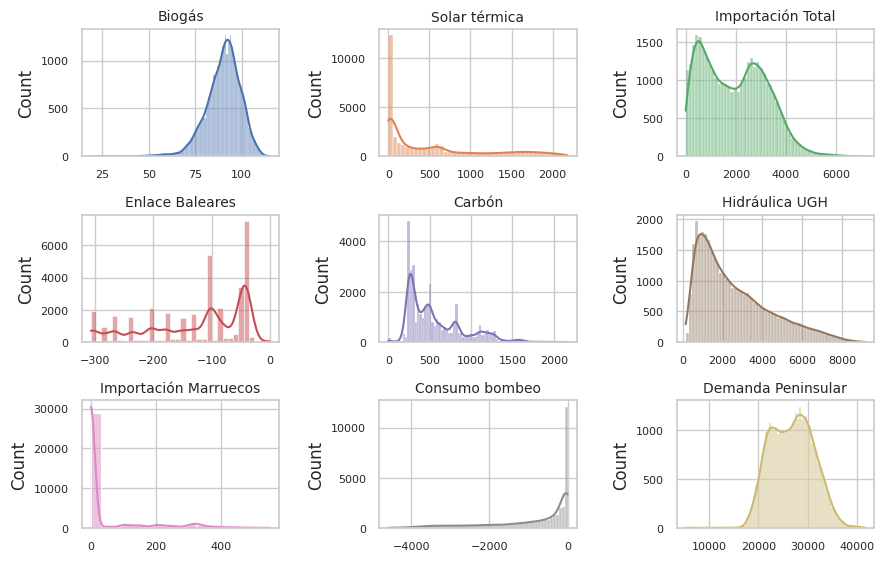

In [ ]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 6))
axes = axes.flat
columnas_numeric_next_9 = columnas_numeric[20:29]

for i, colum in enumerate(columnas_numeric_next_9[:len(axes)]):
    sns.histplot(
        data    = df,
        x       = colum,
        stat    = "count",
        kde     = True,
        color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 10)
    axes[i].tick_params(labelsize = 8)
    axes[i].set_xlabel("")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('', fontsize = 12);

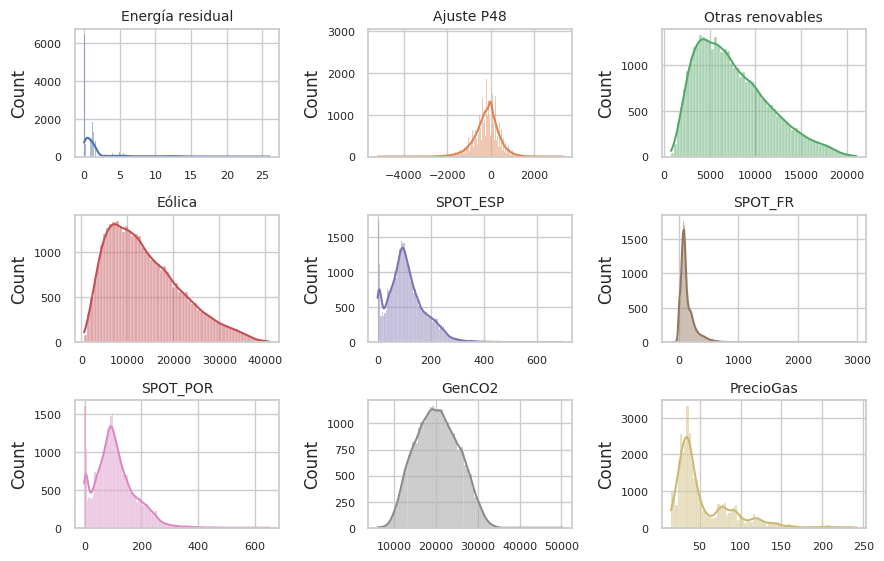

In [ ]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 6))
axes = axes.flat
columnas_numeric_next_9 = columnas_numeric[30:39]

for i, colum in enumerate(columnas_numeric_next_9[:len(axes)]):
    sns.histplot(
        data    = df,
        x       = colum,
        stat    = "count",
        kde     = True,
        color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 10)
    axes[i].tick_params(labelsize = 8)
    axes[i].set_xlabel("")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('', fontsize = 12);

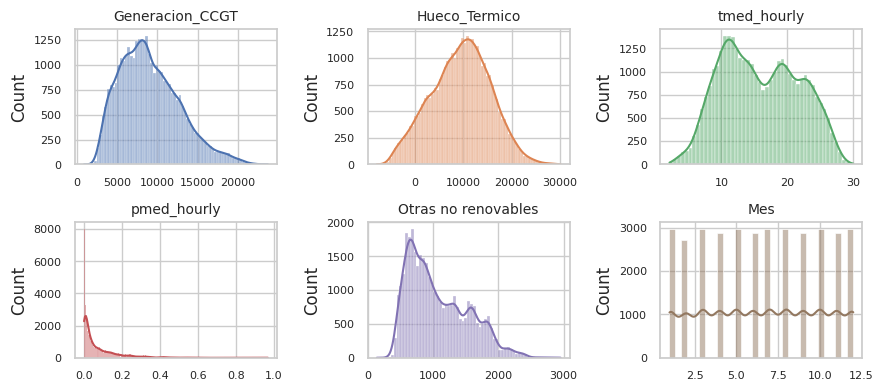

In [ ]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 6))
axes = axes.flat
columnas_numeric_from_47 = columnas_numeric[46:]

num_subplots_needed = len(columnas_numeric_from_47)
num_to_plot = min(len(axes), num_subplots_needed)

for i, colum in enumerate(columnas_numeric_from_47[:num_to_plot]):
    sns.histplot(
        data    = df,
        x       = colum,
        stat    = "count",
        kde     = True,
        color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 10)
    axes[i].tick_params(labelsize = 8)
    axes[i].set_xlabel("")

for j in range(num_to_plot, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('', fontsize = 12);


# Modelos de predicción

## Análisis de regresión múltiple

Para la regresión es importante escalar los datos.

In [ ]:
data = df.copy()
data2 = df2025.copy()

In [ ]:
columnas_a_normalizar = data.select_dtypes(include=np.number).columns.tolist()
if 'SPOT_ESP' in columnas_a_normalizar:
    columnas_a_normalizar.remove('SPOT_ESP')

scaler = StandardScaler()
data[columnas_a_normalizar] = scaler.fit_transform(data[columnas_a_normalizar])

In [ ]:
columnas_a_normalizar = data2.select_dtypes(include=np.number).columns.tolist()
if 'SPOT_ESP' in columnas_a_normalizar:
    columnas_a_normalizar.remove('SPOT_ESP')

data2[columnas_a_normalizar] = data2[columnas_a_normalizar].astype(float)
scaler = StandardScaler()
data2.loc[:, columnas_a_normalizar] = scaler.fit_transform(data2[columnas_a_normalizar])

### Todas las variables


Eliminamos las variables SPOT --> no nos sirve

In [ ]:
modeloinicial = data.copy()

In [ ]:
X = modeloinicial.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR', 'datetime', 'date'], errors='ignore')
y = modeloinicial['SPOT_ESP']

X_train, X_test, y_train, y_test = train_test_split(
                                        X,
                                        y.values.reshape(-1,1),
                                        train_size   = 0.8,
                                        random_state = 1234,
                                        shuffle      = False
                                    )

modelo = LinearRegression()
modelo.fit(X_train, y_train)
puntuacion = modelo.score(X_test, y_test)
predicciones = modelo.predict(X_test)

In [ ]:
r2_train = modelo.score(X_train, y_train)
r2_test = modelo.score(X_test, y_test)

print(f"R² en entrenamiento: {r2_train:.4f}")
print(f"R² en test:         {r2_test:.4f}")

R² en entrenamiento: 0.9062
R² en test:         0.4886


In [ ]:
rmse = np.sqrt(mean_squared_error(y_test, predicciones))
print(f"RMSE test: {rmse:.2f}")


RMSE test: 34.00


In [ ]:
print(f"El número de columnas en X_train es: {X_train.shape[1]}")

El número de columnas en X_train es: 49


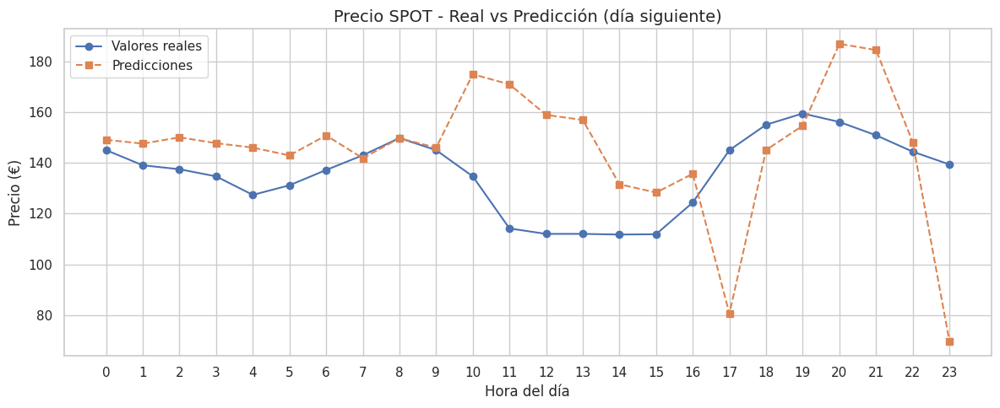

In [ ]:
X_ultimas = X.tail(24)
predicciones = modelo.predict(X_ultimas)
y_real = y[-24:]

plt.figure(figsize=(12, 5))
plt.plot(range(24), y_real.values, marker='o', label='Valores reales')
plt.plot(range(24), predicciones, marker='s', label='Predicciones', linestyle='--')

plt.title('Precio SPOT - Real vs Predicción (día siguiente)', fontsize=14)
plt.xlabel('Hora del día', fontsize=12)
plt.ylabel('Precio (€)', fontsize=12)
plt.xticks(range(24))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Para intentar mejorar nuestro modelo, evitando el sobreajuste, vamos a aplicar diferentes técnicas.

### Funciones

In [ ]:
def forward_selection(
    X: pd.DataFrame,
    y: pd.Series,
    criterio: str='aic',
    add_constant: bool=True,
    verbose: bool=True
)-> list:

    """
    Realiza un procedimiento de selección de variables hacia adelante (forward)
    utilizando como criterio de bondad la métrica especificada. El procedimiento
    se detiene cuando no es posible mejorar más el modelo añadiendo variables.

    Parameters
    ----------
    X: pd.DataFrame
        Matriz de predictores
    y: pd.Series
        Variable respuesta
    metrica: str, default='aic'
        Métrica utilizada para seleccionar las variables. Debe ser una de las
        siguientes opciones: 'aic', 'bic', 'rsquared_adj'.
    add_constant: bool, default=True
        Si `True` añade una columna de 1s a la matriz de predictores con el
        con el nombre de intercept.
    verbose: bool, default=True
        Si `True` muestra por pantalla los resultados de cada iteración.

    Returns
    -------
    seleccion: list
        Lista con las variables seleccionadas.
    """

    if add_constant:
        X = sm.add_constant(X, prepend=True).rename(columns={'const':'intercept'})

    restantes = X.columns.to_list()
    seleccion = []
    if criterio == 'rsquared_adj':
        mejor_metrica = -np.inf
        ultima_metrica = -np.inf
    else:
        mejor_metrica = np.inf
        ultima_metrica = np.inf

    while restantes:
        metricas = []
        for candidata in restantes:
            seleccion_temp = seleccion + [candidata]
            modelo  = sm.OLS(endog=y, exog=X[seleccion_temp])
            modelo_res = modelo.fit()
            metrica = getattr(modelo_res, criterio)
            metricas.append(metrica)
        if criterio == 'rsquared_adj':
            mejor_metrica = max(metricas)
            if mejor_metrica > ultima_metrica:
                mejor_variable = restantes[np.argmax(metricas)]
            else:
                break
        else:
            mejor_metrica = min(metricas)
            if mejor_metrica < ultima_metrica:
                mejor_variable = restantes[np.argmin(metricas)]
            else:
                break

        seleccion.append(mejor_variable)
        restantes.remove(mejor_variable)
        ultima_metrica = mejor_metrica

        if verbose:
            print(f'variables: {seleccion} | {criterio}: {mejor_metrica:.3f}')

    return sorted(seleccion)


def backward_selection(
    X: pd.DataFrame,
    y: pd.Series,
    criterio: str='aic',
    add_constant: bool=True,
    verbose: bool=True
)-> list:

    """
    Realiza un procedimiento de selección de variables hacia atrás (backward)
    utilizando como criterio de bondad la métrica especificada. El procedimiento
    se detiene cuando no es posible mejorar más el modelo eliminando variables.

    Parameters
    ----------
    X: pd.DataFrame
        Matriz de predictores
    y: pd.Series
        Variable respuesta
    metrica: str, default='aic'
        Métrica utilizada para seleccionar las variables. Debe ser una de las
        siguientes opciones: 'aic', 'bic', 'rsquared_adj'.
    add_constant: bool, default=True
        Si `True` añade una columna de 1s a la matriz de predictores con el
        con el nombre de intercept.
    verbose: bool, default=True
        Si `True` muestra por pantalla los resultados de cada iteración.

    Returns
    -------
    seleccion: list
        Lista con las variables seleccionadas.
    """

    if add_constant:
        X = sm.add_constant(X, prepend=True).rename(columns={'const':'intercept'})


    seleccion = X.columns.to_list()
    modelo  = sm.OLS(endog=y, exog=X[seleccion])
    modelo_res = modelo.fit()
    ultima_metrica = getattr(modelo_res, criterio)
    mejor_metrica = ultima_metrica
    if verbose:
            print(f'variables: {seleccion} | {criterio}: {mejor_metrica:.3f}')

    while seleccion:
        metricas = []
        for candidata in seleccion:
            seleccion_temp = seleccion.copy()
            seleccion_temp.remove(candidata)
            modelo  = sm.OLS(endog=y, exog=X[seleccion_temp])
            modelo_res = modelo.fit()
            metrica = getattr(modelo_res, criterio)
            metricas.append(metrica)
        if criterio == 'rsquared_adj':
            mejor_metrica = max(metricas)
            if mejor_metrica > ultima_metrica:
                peor_variable = seleccion[np.argmax(metricas)]
            else:
                break
        else:
            mejor_metrica = min(metricas)
            if mejor_metrica < ultima_metrica:
                peor_variable = seleccion[np.argmin(metricas)]
            else:
                break

        seleccion.remove(peor_variable)
        ultima_metrica = mejor_metrica

        if verbose:
            print(f'variables: {seleccion} | {criterio}: {mejor_metrica:.3f}')

    return sorted(seleccion)

### Técnicas de selección

In [ ]:
modeloforward = data.copy()

In [ ]:
X = modeloforward.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR', 'datetime', 'date'], errors='ignore')
y = modeloforward['SPOT_ESP']

X_train, X_test, y_train, y_test = train_test_split(
                                        X,
                                        y.values.reshape(-1,1),
                                        train_size   = 0.8,
                                        random_state = 1234,
                                        shuffle      = False
                                    )

In [ ]:
forward = forward_selection(
    X=X_train,
    y=y_train.flatten(),
    criterio='aic',
    add_constant=True,
    verbose=False
)

In [ ]:
predictores1_sin_intercept = [var for var in forward if var not in ['intercept', 'const']]
X_train_sel = sm.add_constant(X_train[predictores1_sin_intercept], has_constant='add')
X_test_sel  = sm.add_constant(X_test[predictores1_sin_intercept], has_constant='add')

X_test_sel = X_test_sel[X_train_sel.columns]

modelo_res = sm.OLS(y_train, X_train_sel).fit()
y_pred = modelo_res.predict(X_test_sel)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"R² test:  {r2:.4f}")
print(f"RMSE test: {rmse:.2f}")

R² test:  0.5795
RMSE test: 30.83


In [ ]:
predictores1_sin_intercept = [var for var in forward if var not in ['intercept', 'const']]
X_train_sel = sm.add_constant(X_train[predictores1_sin_intercept], has_constant='add')

modelo_res = sm.OLS(y_train, X_train_sel).fit()

y_pred_train = modelo_res.predict(X_train_sel)

r2_train = r2_score(y_train, y_pred_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))

print(f"R² train:  {r2_train:.4f}")
print(f"RMSE train: {rmse_train:.2f}")

R² train:  0.9041
RMSE train: 22.40


In [ ]:
modelobackward = data.copy()

In [ ]:
X = modelobackward.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR', 'datetime', 'date'], errors='ignore')
y = modelobackward['SPOT_ESP']

X_train, X_test, y_train, y_test = train_test_split(
                                        X,
                                        y.values.reshape(-1,1),
                                        train_size   = 0.8,
                                        random_state = 1234,
                                        shuffle      = False
                                    )

In [ ]:
backward = backward_selection(
    X            = X_train,
    y            = y_train,
    criterio     = 'aic',
    add_constant = False,
    verbose      = False
)

In [ ]:
predictores2_sin_intercept = [var for var in backward if var not in ['intercept', 'const']]
X_train_sel = sm.add_constant(X_train[predictores2_sin_intercept], has_constant='add')
X_test_sel  = sm.add_constant(X_test[predictores2_sin_intercept], has_constant='add')

X_test_sel = X_test_sel[X_train_sel.columns]

modelo_res = sm.OLS(y_train, X_train_sel).fit()
y_pred = modelo_res.predict(X_test_sel)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"R² test:  {r2:.4f}")
print(f"RMSE test: {rmse:.2f}")

R² test:  0.4978
RMSE test: 33.69


#### Regularizacion L2

In [ ]:
vars_seleccionadas = [v for v in forward if v not in ['intercept', 'const']]
X_train_sel = X_train[vars_seleccionadas]
X_test_sel  = X_test[vars_seleccionadas]

alphas = np.logspace(-5, 5, 100)
modelo_ridge = RidgeCV(alphas=alphas, cv=5)

modelo_ridge.fit(X_train_sel, y_train)

y_pred = modelo_ridge.predict(X_test_sel)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"R² en test:  {r2:.4f}")
print(f"MSE en test: {rmse:.2f}")

R² en test:  0.7006
MSE en test: 26.01


In [ ]:
print(f"El número de columnas en X_train es: {X_train_sel.shape[1]}")

El número de columnas en X_train es: 34


In [ ]:
vars_seleccionadas = [v for v in backward if v not in ['intercept', 'const']]
X_train_sel = X_train[vars_seleccionadas]
X_test_sel  = X_test[vars_seleccionadas]

alphas = np.logspace(-5, 5, 100)
modelo_ridge = RidgeCV(alphas=alphas, cv=5)

modelo_ridge.fit(X_train_sel, y_train)

y_pred = modelo_ridge.predict(X_test_sel)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"R² en test:  {r2:.4f}")
print(f"RMSE en test: {rmse:.2f}")

R² en test:  0.6981
RMSE en test: 26.12


In [ ]:
print(f"El número de columnas en X_train es: {X_train_sel.shape[1]}")

El número de columnas en X_train es: 45


#### Regularizacion L1

In [ ]:
predictores_forward = [col for col in forward if col != 'intercept']
X_train_sel = X_train[predictores_forward]
X_test_sel = X_test[predictores_forward]

modelo_lasso = make_pipeline(
    StandardScaler(),
    LassoCV(cv=12, max_iter=10000, random_state=42)
)

modelo_lasso.fit(X_train_sel, y_train.ravel())
y_pred = modelo_lasso.predict(X_test_sel)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
alpha = modelo_lasso.named_steps['lassocv'].alpha_

print(f"R² en test:  {r2:.4f}")
print(f"RMSE en test: {rmse:.2f}")
print(f"MAE en test: {mae:.2f}")
print(f"Número de predictores usados: {X_train_sel.shape[1]}")

R² en test:  0.7249
RMSE en test: 24.94
MAE en test: 20.55
Número de predictores usados: 34


Validacion

In [ ]:
X_2025_sel = data2[predictores_forward].drop(columns=['const'], errors='ignore')

In [ ]:
y_real = data2['SPOT_ESP'].values

In [ ]:
predictores_forward = [col for col in forward if col != 'intercept']
X_train_sel = X_train[predictores_forward]
X_test_sel = X_test[predictores_forward]

modelo_lasso = make_pipeline(
    StandardScaler(),
    LassoCV(cv=12, max_iter=10000, random_state=42)
)

modelo_lasso.fit(X_train_sel, y_train.ravel())
y_pred = modelo_lasso.predict(X_2025_sel)

r2 = r2_score(y_real, y_pred)
rmse = np.sqrt(mean_squared_error(y_real, y_real))
alpha = modelo_lasso.named_steps['lassocv'].alpha_
mae_2025 = mean_absolute_error(y_real, y_real)

predictores_forward = [col for col in forward if col != 'intercept']
X_train_sel = X_train[predictores_forward]
X_test_sel = X_test[predictores_forward]

modelo_lasso = make_pipeline(
    StandardScaler(),
    LassoCV(cv=12, max_iter=10000, random_state=42)
)

modelo_lasso.fit(X_train_sel, y_train.ravel())
y_pred = modelo_lasso.predict(X_2025_sel)

r2 = r2_score(y_real, y_pred)
rmse = np.sqrt(mean_squared_error(y_real, y_pred))
alpha = modelo_lasso.named_steps['lassocv'].alpha_
mae_2025 = mean_absolute_error(y_real, y_pred)

print(f"R² en validacio:  {r2:.4f}")
print(f"RMSE en validacion: {rmse:.2f}")
print(f"MAE en validacion : {mae_2025:.2f}")

R² en validacio:  -0.2642
RMSE en validacion: 60.47
MAE en validacion : 53.22


In [ ]:
predictores_backward = [col for col in backward if col != 'intercept']
X_train_sel = X_train[predictores_backward]
X_test_sel = X_test[predictores_backward]

modelo_lasso = make_pipeline(
    StandardScaler(),
    LassoCV(cv=12, max_iter=10000, random_state=42)
)

modelo_lasso.fit(X_train_sel, y_train.ravel())
y_pred = modelo_lasso.predict(X_test_sel)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
alpha = modelo_lasso.named_steps['lassocv'].alpha_

print(f"R² en test:  {r2:.4f}")
print(f"RMSE en test: {rmse:.2f}")
print(f" Número de predictores usados: {X_train_sel.shape[1]}")

R² en test:  0.7151
RMSE en test: 25.38
 Número de predictores usados: 45


### Modelo de correlacion

In [ ]:
modelocorrelacion = data.copy()

In [ ]:
X = modelocorrelacion.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR', 'PVPC',  'datetime', 'date'], errors='ignore')
y = modelocorrelacion['SPOT_ESP']

In [ ]:
df_num = df.select_dtypes(include=['float64', 'int'])
df_num = df_num.drop(columns=['SPOT_POR', 'SPOT_FR'])
correlation_matrix = df_num.corr()
correlaciones = correlation_matrix['SPOT_ESP'].drop('SPOT_ESP').abs().sort_values(ascending=False)
top_variables = correlaciones.head(10).index.tolist()
top_variables

['PVPC',
 'Otras no renovables',
 'PrecioGas',
 'Generacion_CCGT',
 'Carbón',
 'Biomasa',
 'Ciclo combinado',
 'Biogás',
 'Hueco_Termico',
 'Consumo bombeo']

In [ ]:
X = modelocorrelacion[top_variables]
y = modelocorrelacion['SPOT_ESP']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    train_size=0.8,
    random_state=1234,
    shuffle=False
)


modelo = LinearRegression()
modelo.fit(X_train, y_train)
y_pred = modelo.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("R² en test:", round(r2, 4))
print("RMSE en test:", round(rmse, 2))

R² en test: 0.8722
RMSE en test: 14.32


In [ ]:
mae_test = mean_absolute_error(y_test, y_pred)
print("MAE en test:", round(mae_test, 2))


X_2025 = df2025[top_variables]
y_2025_real = df2025['SPOT_ESP'].values
y_pred_2025 = modelo.predict(X_2025)

mae_2025 = mean_absolute_error(y_2025_real, y_pred_2025)
rmse_2025 = np.sqrt(mean_squared_error(y_2025_real, y_pred_2025))

print("MAE en datos 2025:", round(mae_2025, 2))
print("RMSE en datos 2025:", round(rmse_2025, 2))

MAE en test: 11.02
MAE en datos 2025: 14.72
RMSE en datos 2025: 18.13


## Árboles de decisión

Todas las variables

In [ ]:
arboles = df.copy()

In [ ]:
X = arboles.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR', 'PVPC', 'date', 'datetime'], errors='ignore')
y = arboles['SPOT_ESP']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    train_size=0.8,
    shuffle=False,
    random_state=123
)

modelo = DecisionTreeRegressor(max_depth = 3,random_state = 123)

modelo.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3, random_state=123)

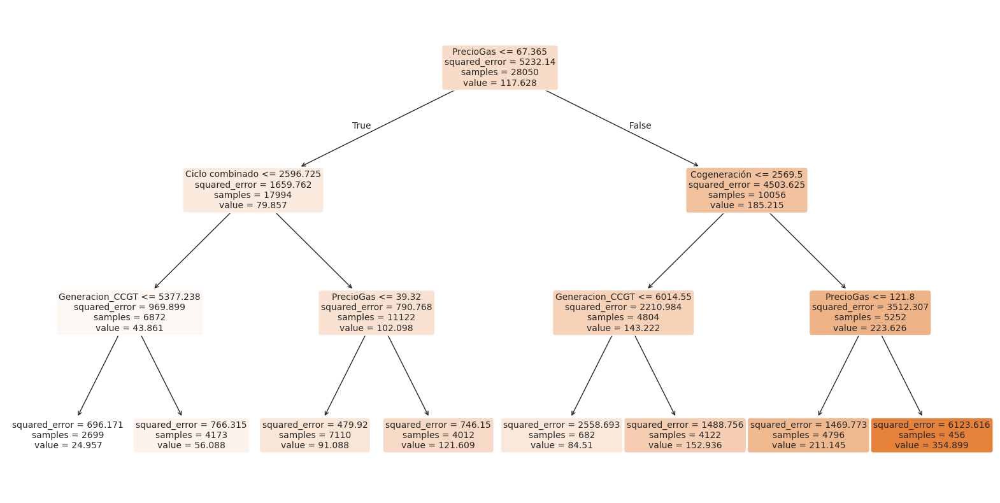

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(
    decision_tree=modelo,
    feature_names=X_train.columns,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.show()

In [ ]:
print(f"Profundidad del árbol: {modelo.get_depth()}")
print(f"Número de nodos terminales: {modelo.get_n_leaves()}")

Profundidad del árbol: 3
Número de nodos terminales: 8


In [ ]:
tree_rules = export_text(modelo, feature_names=X_train.columns.tolist())
print(tree_rules)

|--- PrecioGas <= 67.36
|   |--- Ciclo combinado <= 2596.72
|   |   |--- Generacion_CCGT <= 5377.24
|   |   |   |--- value: [24.96]
|   |   |--- Generacion_CCGT >  5377.24
|   |   |   |--- value: [56.09]
|   |--- Ciclo combinado >  2596.72
|   |   |--- PrecioGas <= 39.32
|   |   |   |--- value: [91.09]
|   |   |--- PrecioGas >  39.32
|   |   |   |--- value: [121.61]
|--- PrecioGas >  67.36
|   |--- Cogeneración <= 2569.50
|   |   |--- Generacion_CCGT <= 6014.55
|   |   |   |--- value: [84.51]
|   |   |--- Generacion_CCGT >  6014.55
|   |   |   |--- value: [152.94]
|   |--- Cogeneración >  2569.50
|   |   |--- PrecioGas <= 121.80
|   |   |   |--- value: [211.14]
|   |   |--- PrecioGas >  121.80
|   |   |   |--- value: [354.90]



In [ ]:
predicciones = modelo.predict(X = X_test)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)

print(f"RMSE: {rmse:.2f}")

RMSE: 28.11


In [ ]:
arboles.mean(numeric_only=True)

,0
hour,11.499672
Turbinación bombeo,399.266966
Exportación Andorra,-29.292487
Nuclear,6180.301590
Solar fotovoltaica,3700.869230
Hidráulica,3157.585986
Generación + Bombeo + Cable,28047.376080
Exportación Marruecos,-205.333114
Exportación Francia,-1305.780416
Gas Natural Cogeneración,2083.378261


In [ ]:
modelo = DecisionTreeRegressor(random_state=123)

param_grid = {
    'max_depth': [2, 3, 5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(
    estimator=modelo,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=123), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 15, None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
print(grid_search.best_params_)

{'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}


In [ ]:
mejor_modelo = grid_search.best_estimator_

In [ ]:
predicciones = grid_search.predict(X = X_test)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)

print(f"RMSE: {rmse:.2f}")

RMSE: 23.50


Validacion

In [ ]:
X_2025_sel = df2025[X_train.columns]
y_2025_real = df2025['SPOT_ESP'].values

predicciones_2025 = grid_search.predict(X_2025_sel)

mse_2025 = mean_squared_error(y_2025_real, predicciones_2025)
rmse_2025 = np.sqrt(mse_2025)


print(f"RMSE en datos 2025: {rmse_2025:.2f}")

RMSE en datos 2025: 41.60


In [ ]:
arboles.mean(numeric_only=True)

,0
hour,11.499672
Turbinación bombeo,399.266966
Exportación Andorra,-29.292487
Nuclear,6180.301590
Solar fotovoltaica,3700.869230
Hidráulica,3157.585986
Generación + Bombeo + Cable,28047.376080
Exportación Marruecos,-205.333114
Exportación Francia,-1305.780416
Gas Natural Cogeneración,2083.378261


In [ ]:
tree_rules = export_text(mejor_modelo, feature_names=X_train.columns.tolist())
print(tree_rules)

|--- PrecioGas <= 67.36
|   |--- Ciclo combinado <= 2596.72
|   |   |--- Generacion_CCGT <= 5377.24
|   |   |   |--- Generacion_CCGT <= 4170.30
|   |   |   |   |--- Nuclear <= 6961.35
|   |   |   |   |   |--- Estacion <= 1.50
|   |   |   |   |   |   |--- Turbinación bombeo <= 981.62
|   |   |   |   |   |   |   |--- Energía residual <= 14.20
|   |   |   |   |   |   |   |   |--- Carbón <= 216.50
|   |   |   |   |   |   |   |   |   |--- Turbinación bombeo <= 236.70
|   |   |   |   |   |   |   |   |   |   |--- value: [7.01]
|   |   |   |   |   |   |   |   |   |--- Turbinación bombeo >  236.70
|   |   |   |   |   |   |   |   |   |   |--- value: [32.30]
|   |   |   |   |   |   |   |   |--- Carbón >  216.50
|   |   |   |   |   |   |   |   |   |--- Otras renovables <= 16462.64
|   |   |   |   |   |   |   |   |   |   |--- value: [1.63]
|   |   |   |   |   |   |   |   |   |--- Otras renovables >  16462.64
|   |   |   |   |   |   |   |   |   |   |--- value: [6.20]
|   |   |   |   |   |   |   |---

In [ ]:
predicciones = grid_search.predict(X_test)
mse = mean_squared_error(y_test, predicciones)
rmse = np.sqrt(mse)
mae_test = mean_absolute_error(y_test, predicciones)

print(f"RMSE en test: {rmse:.2f}")
print(f"MAE en test: {mae_test:.2f}")

X_2025_sel = df2025[X_train.columns]
y_2025_real = df2025['SPOT_ESP'].values

predicciones_2025 = grid_search.predict(X_2025_sel)
mse_2025 = mean_squared_error(y_2025_real, predicciones_2025)
rmse_2025 = np.sqrt(mse_2025)
mae_2025 = mean_absolute_error(y_2025_real, predicciones_2025)

print(f"RMSE en datos 2025: {rmse_2025:.2f}")
print(f"MAE en datos 2025: {mae_2025:.2f}")

RMSE en test: 23.50
MAE en test: 16.10
RMSE en datos 2025: 41.60
MAE en datos 2025: 32.15


## Random Forest

In [ ]:
datos1 = df.copy()

X_train, X_test, y_train, y_test = train_test_split(
    datos1.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR', 'PVPC']),
    datos1["SPOT_ESP"],
    test_size=0.25,
    random_state=123
)


In [ ]:
X_train = X_train.select_dtypes(exclude='datetime64')
X_test = X_test.select_dtypes(exclude='datetime64')


X_train['date'] = pd.to_datetime(X_train['date'])
X_test['date'] = pd.to_datetime(X_test['date'])


for datos1 in [X_train, X_test]:
    datos1['hora'] = datos1['date'].dt.hour
    datos1['dia_semana'] = datos1['date'].dt.dayofweek
    datos1['mes'] = datos1['date'].dt.month
    datos1['año'] = datos1['date'].dt.year
    datos1.drop(columns='date', inplace=True)

El modelo inicial se entrena utilizando 10 arboles y manteniendo en resto de hiperparámetros por defecto.

In [ ]:
modelo_rf = RandomForestRegressor(
    n_estimators=10,
    criterion='squared_error',
    max_depth=None,
    max_features=1,
    oob_score=False,
    n_jobs=-1,
    random_state=123
)

modelo_rf.fit(X_train, y_train)

RandomForestRegressor(max_features=1, n_estimators=10, n_jobs=-1,
                      random_state=123)

In [ ]:
predicciones = modelo_rf.predict(X=X_test)
rmse = np.sqrt(mean_squared_error(y_test, predicciones))
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 19.092785184779558


Analizar los hiperparámetros de manera individual para encontrar los óptimos no está mal, pero no es la mejor solución ya que entre ellos interaccionan para conseguir el mejor modelo. Por lo tanto, vamos aplicar el grid search para analizar las combinaciones de los mejores hiperparámetros.

In [ ]:
modelo_rf = RandomForestRegressor(random_state=123)
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_features': [5, 7, 9],
    'max_depth': [None, 3, 10, 20]
}

cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=123)

grid = GridSearchCV(
    estimator=modelo_rf,
    param_grid=param_grid,
    scoring='neg_root_mean_squared_error',
    n_jobs=multiprocessing.cpu_count() - 1,
    cv=cv,
    refit=True,
    verbose=0
)

In [ ]:
grid.fit(X_train, y_train)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=123),
             estimator=RandomForestRegressor(random_state=123), n_jobs=1,
             param_grid={'max_depth': [None, 3, 10, 20],
                         'max_features': [5, 7, 9],
                         'n_estimators': [50, 100, 150]},
             scoring='neg_root_mean_squared_error')

In [ ]:
print("Mejores hiperparámetros encontrados")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

Mejores hiperparámetros encontrados
{'max_depth': None, 'max_features': 9, 'n_estimators': 150} : -10.346665338097713 neg_root_mean_squared_error


In [ ]:
X_train.columns

Index(['hour', 'Turbinación bombeo', 'Exportación Andorra', 'Nuclear',
       'Solar fotovoltaica', 'Hidráulica', 'Generación + Bombeo + Cable',
       'Exportación Marruecos', 'Exportación Francia',
       'Gas Natural Cogeneración', 'Importación Portugal', 'Cogeneración',
       'Hidráulica no UGH', 'Generación P48 total', 'Ciclo combinado',
       'Biomasa', 'Exportación Portugal', 'Exportación Total',
       'Generación + Interconexiones', 'Importación Francia', 'Biogás',
       'Solar térmica', 'Importación Total', 'Enlace Baleares', 'Carbón',
       'Hidráulica UGH', 'Importación Marruecos', 'Consumo bombeo',
       'Demanda Peninsular', 'Total Almacenamiento', 'Energía residual',
       'Ajuste P48', 'Otras renovables', 'Eólica', 'GenCO2', 'PrecioGas',
       'DiaSemana', 'TipoDia', 'HoraTrabajo', 'Año', 'Estacion',
       'Generacion_Solar', 'Generacion_CCGT', 'Hueco_Termico', 'tmed_hourly',
       'pmed_hourly', 'Otras no renovables', 'Mes', 'hora', 'dia_semana',
       'mes',

In [ ]:

modelo_final = grid.best_estimator_
predicciones = modelo_final.predict(X=X_test)

rmse = np.sqrt(mean_squared_error(y_test, predicciones))
mae = mean_absolute_error(y_test, predicciones)

print(f"El error (RMSE) de test es: {rmse:.2f}")
print(f"El error (MAE) de test es: {mae:.2f}")

El error (RMSE) de test es: 9.84
El error (MAE) de test es: 6.27


In [ ]:
df2025['fecha'] = pd.to_datetime(df2025['fecha'], dayfirst=True)

df2025['año'] = df2025['fecha'].dt.year
df2025['mes'] = df2025['fecha'].dt.month
df2025['dia_semana'] = df2025['fecha'].dt.dayofweek
df2025['hora'] = df2025['fecha'].dt.hour

X_2025_val = df2025[X_train.columns]
y_2025_real = df2025['SPOT_ESP'].values

y_pred_2025 = modelo_final.predict(X_2025_val)

rmse_2025 = np.sqrt(mean_squared_error(y_2025_real, y_pred_2025))
mae_2025 = mean_absolute_error(y_2025_real, y_pred_2025)
r2_2025 = r2_score(y_2025_real, y_pred_2025)

print("\nResultados en 2025 (Validación):")
print(f"RMSE: {rmse_2025:.2f}")
print(f"MAE: {mae_2025:.2f}")


Resultados en 2025 (Validación):
RMSE: 22.41
MAE: 18.28


## Redes Neuronales


#### Modelo base

In [ ]:
red = df.copy()

In [ ]:
X = red.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR'])
y = red['SPOT_ESP']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=123
)

In [ ]:
X_train_numeric = X_train.select_dtypes(include=['number'])
X_test_numeric = X_test.select_dtypes(include=['number'])

scaler = StandardScaler()
scaler.fit(X_train_numeric)

X_train_norm = scaler.transform(X_train_numeric)
X_test_norm = scaler.transform(X_test_numeric)

In [ ]:
def build_model():
    model = models.Sequential()
    model.add(Input(shape=(train_data.shape[1],)))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(1))

    model.compile(
        optimizer='rmsprop',
        loss='mse',
        metrics=[tf.keras.metrics.MeanAbsoluteError()]
    )
    return model

In [ ]:
train_data = X_train_norm
train_targets = y_train.to_numpy()

In [ ]:
mymodel = build_model()

In [ ]:
history = mymodel.fit(
    X_train_norm,
    y_train,
    epochs=40,
    batch_size=64,
    validation_data=(train_data, train_targets)
)

Epoch 1/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 5687.5386 - mean_absolute_error: 51.5572 - val_loss: 452.2124 - val_mean_absolute_error: 16.3291
Epoch 2/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 418.7933 - mean_absolute_error: 15.7839 - val_loss: 376.8495 - val_mean_absolute_error: 14.8510
Epoch 3/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 326.2923 - mean_absolute_error: 13.7539 - val_loss: 287.5321 - val_mean_absolute_error: 12.8974
Epoch 4/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 274.1868 - mean_absolute_error: 12.5142 - val_loss: 350.2014 - val_mean_absolute_error: 14.1382
Epoch 5/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 237.8474 - mean_absolute_error: 11.7092 - val_loss: 263.8034 - val_mean_absolute_error: 12.2724
Epoch 6/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 209.6902 - mean_absolute_error: 10.9904 - val_loss: 182.8145 - val_mean_absolute_error: 10.3148
Epoch 7/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 188

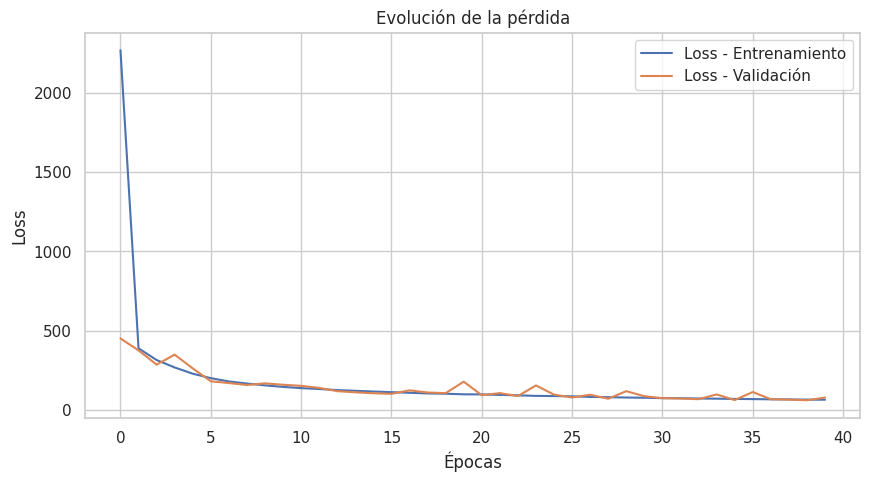

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Loss - Entrenamiento')
plt.plot(history.history['val_loss'], label='Loss - Validación')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.title('Evolución de la pérdida')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
y_pred = mymodel.predict(X_test_norm)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# 3. Mostrar resultados
print(f"MAE en test: {mae:.2f}")
print(f"RMSE en test: {rmse:.2f}")

220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MAE en test: 6.97
RMSE en test: 9.33


In [ ]:
y_pred_train = mymodel.predict(X_train_norm)

mae_train = mean_absolute_error(y_train, y_pred_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))

print(f"MAE en entrenamiento: {mae_train:.2f}")
print(f"RMSE en entrenamiento: {rmse_train:.2f}")

877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MAE en entrenamiento: 6.77
RMSE en entrenamiento: 8.94


#### Validacion k-iteraciones

In [ ]:
validacion = df.copy()

In [ ]:
X = validacion.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR'])
X = X.select_dtypes(include=np.number)
y = validacion['SPOT_ESP']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=123
)

In [ ]:
X_train_num = X_train.select_dtypes(include=['float64', 'int'])
X_test_num = X_test[X_train_num.columns]

mean = X_train_num.mean(axis=0)
std = X_train_num.std(axis=0)

X_train_norm = (X_train_num - mean) / std
X_test_norm = (X_test_num - mean) / std

In [ ]:
def build_model():
    model = models.Sequential()
    model.add(layers.Dense(128, activation='relu', input_shape=(train_data.shape[1],)))
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(1))

    model.compile(
        optimizer='adam',
        loss='mse',
        metrics=[tf.keras.metrics.MeanAbsoluteError()]
    )
    return model


train_data = X_train_norm.to_numpy()
train_targets = y_train.to_numpy()

mymodel = build_model()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [ ]:
k = 5
num_val_samples = len(train_data) // k
num_epochs = 40
batch_size = 64

all_maes = []
all_rmses = []
all_maes_train = []
all_rmses_train = []

for i in range(k):
    print(f'\nFold {i+1}/{k}')
    val_data = train_data[i * num_val_samples: (i + 1) * num_val_samples]
    val_targets = train_targets[i * num_val_samples: (i + 1) * num_val_samples]

    partial_train_data = np.concatenate(
        [train_data[:i * num_val_samples],
         train_data[(i + 1) * num_val_samples:]],
        axis=0)
    partial_train_targets = np.concatenate(
        [train_targets[:i * num_val_samples],
         train_targets[(i + 1) * num_val_samples:]],
        axis=0)

    model = build_model()
    model.fit(partial_train_data, partial_train_targets,
              epochs=num_epochs, batch_size=batch_size, verbose=0)

    y_pred_val = model.predict(val_data, verbose=0)
    mae_val = np.mean(np.abs(val_targets - y_pred_val.flatten()))
    rmse_val = np.sqrt(mean_squared_error(val_targets, y_pred_val))

    all_maes.append(mae_val)
    all_rmses.append(rmse_val)

    print(f'VALIDACIÓN -> MAE: {mae_val:.2f} | RMSE: {rmse_val:.2f}')

    y_pred_train = model.predict(partial_train_data, verbose=0)
    mae_train = np.mean(np.abs(partial_train_targets - y_pred_train.flatten()))
    rmse_train = np.sqrt(mean_squared_error(partial_train_targets, y_pred_train))

    all_maes_train.append(mae_train)
    all_rmses_train.append(rmse_train)

    print(f'ENTRENAMIENTO -> MAE: {mae_train:.2f} | RMSE: {rmse_train:.2f}')

print("\nResumen de Validación Cruzada:")
print(f"MAE promedio VALIDACIÓN: {np.mean(all_maes):.2f}")
print(f"RMSE promedio VALIDACIÓN: {np.mean(all_rmses):.2f}")
print(f"MAE promedio ENTRENAMIENTO: {np.mean(all_maes_train):.2f}")
print(f"RMSE promedio ENTRENAMIENTO: {np.mean(all_rmses_train):.2f}")


Fold 1/5
VALIDACIÓN -> MAE: 5.60 | RMSE: 7.52
ENTRENAMIENTO -> MAE: 4.82 | RMSE: 6.36

Fold 2/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.18 | RMSE: 6.95
ENTRENAMIENTO -> MAE: 4.26 | RMSE: 5.74

Fold 3/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.01 | RMSE: 6.74
ENTRENAMIENTO -> MAE: 4.01 | RMSE: 5.36

Fold 4/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.37 | RMSE: 7.33
ENTRENAMIENTO -> MAE: 4.42 | RMSE: 5.98

Fold 5/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.04 | RMSE: 7.02
ENTRENAMIENTO -> MAE: 4.09 | RMSE: 5.47

Resumen de Validación Cruzada:
MAE promedio VALIDACIÓN: 5.24
RMSE promedio VALIDACIÓN: 7.11
MAE promedio ENTRENAMIENTO: 4.32
RMSE promedio ENTRENAMIENTO: 5.78


In [ ]:

k = 5
num_val_samples = len(train_data) // k
num_epochs = 40
batch_size = 64

all_maes = []
all_rmses = []
all_maes_train = []
all_rmses_train = []

for i in range(k):
    print(f'\nFold {i+1}/{k}')
    val_data = train_data[i * num_val_samples: (i + 1) * num_val_samples]
    val_targets = train_targets[i * num_val_samples: (i + 1) * num_val_samples]

    partial_train_data = np.concatenate(
        [train_data[:i * num_val_samples],
         train_data[(i + 1) * num_val_samples:]],
        axis=0)
    partial_train_targets = np.concatenate(
        [train_targets[:i * num_val_samples],
         train_targets[(i + 1) * num_val_samples:]],
        axis=0)

    model = build_model()
    model.fit(partial_train_data, partial_train_targets,
              epochs=num_epochs, batch_size=batch_size, verbose=0)


    y_pred_val = model.predict(val_data, verbose=0)
    mae_val = np.mean(np.abs(val_targets - y_pred_val.flatten()))
    rmse_val = np.sqrt(mean_squared_error(val_targets, y_pred_val))

    all_maes.append(mae_val)
    all_rmses.append(rmse_val)

    print(f'VALIDACIÓN -> MAE: {mae_val:.2f} | RMSE: {rmse_val:.2f}')


    y_pred_train = model.predict(partial_train_data, verbose=0)
    mae_train = np.mean(np.abs(partial_train_targets - y_pred_train.flatten()))
    rmse_train = np.sqrt(mean_squared_error(partial_train_targets, y_pred_train))

    all_maes_train.append(mae_train)
    all_rmses_train.append(rmse_train)

    print(f'ENTRENAMIENTO -> MAE: {mae_train:.2f} | RMSE: {rmse_train:.2f}')


print("\nResumen de Validación Cruzada:")
print(f"MAE promedio VALIDACIÓN: {np.mean(all_maes):.2f}")
print(f"RMSE promedio VALIDACIÓN: {np.mean(all_rmses):.2f}")
print(f"MAE promedio ENTRENAMIENTO: {np.mean(all_maes_train):.2f}")
print(f"RMSE promedio ENTRENAMIENTO: {np.mean(all_rmses_train):.2f}")


final_model = build_model()
final_model.fit(train_data, train_targets, epochs=num_epochs, batch_size=batch_size, verbose=0)

X_2025_sel = df2025[X_train_num.columns]
X_2025_norm = (X_2025_sel - mean) / std
y_2025_real = df2025['SPOT_ESP'].values


y_pred_2025 = final_model.predict(X_2025_norm.to_numpy(), verbose=0)

mae_2025 = mean_absolute_error(y_2025_real, y_pred_2025)
rmse_2025 = np.sqrt(mean_squared_error(y_2025_real, y_pred_2025))

print("\nValidación en Datos 2025:")
print(f"MAE en datos 2025: {mae_2025:.2f}")
print(f"RMSE en datos 2025: {rmse_2025:.2f}")


Fold 1/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.23 | RMSE: 7.08
ENTRENAMIENTO -> MAE: 4.34 | RMSE: 5.74

Fold 2/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.22 | RMSE: 7.01
ENTRENAMIENTO -> MAE: 4.24 | RMSE: 5.65

Fold 3/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.13 | RMSE: 7.04
ENTRENAMIENTO -> MAE: 4.11 | RMSE: 5.61

Fold 4/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.18 | RMSE: 6.98
ENTRENAMIENTO -> MAE: 4.34 | RMSE: 5.75

Fold 5/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



VALIDACIÓN -> MAE: 5.02 | RMSE: 6.78
ENTRENAMIENTO -> MAE: 4.05 | RMSE: 5.29

Resumen de Validación Cruzada:
MAE promedio VALIDACIÓN: 5.16
RMSE promedio VALIDACIÓN: 6.98
MAE promedio ENTRENAMIENTO: 4.22
RMSE promedio ENTRENAMIENTO: 5.61


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.




Validación en Datos 2025:
MAE en datos 2025: 23.25
RMSE en datos 2025: 28.68


#### Modelo optimizador Adam

In [ ]:
df2 = df.copy()

In [ ]:
X = df2.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR'])
y = df2['SPOT_ESP']


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=123
)

In [ ]:

X_train_num = X_train.select_dtypes(include=['float64', 'int'])
X_test_num = X_test[X_train_num.columns]

mean = X_train_num.mean(axis=0)
std = X_train_num.std(axis=0)

X_train_norm = (X_train_num - mean) / std
X_test_norm = (X_test_num - mean) / std

In [ ]:
def build_model():
    model = models.Sequential()
    model.add(layers.Dense(32, activation='relu', input_shape=(train_data.shape[1],)))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(1))

    model.compile(
        optimizer='adam',
        loss='mse',
        metrics=[tf.keras.metrics.MeanAbsoluteError()]
    )

    return model

In [ ]:
train_data = X_train_norm.to_numpy()
train_targets = y_train.to_numpy()

In [ ]:
mymodel = build_model()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [ ]:
history = mymodel.fit(
    X_train_norm,
    y_train,
    validation_data=(train_data, train_targets),
    epochs=40,
    batch_size=64,
)

Epoch 1/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6809.0054 - mean_absolute_error: 57.6047 - val_loss: 491.8669 - val_mean_absolute_error: 17.2176
Epoch 2/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 446.9637 - mean_absolute_error: 16.3033 - val_loss: 347.6421 - val_mean_absolute_error: 14.1968
Epoch 3/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 335.2873 - mean_absolute_error: 13.9792 - val_loss: 274.2628 - val_mean_absolute_error: 12.5552
Epoch 4/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 262.7609 - mean_absolute_error: 12.3419 - val_loss: 226.0615 - val_mean_absolute_error: 11.4459
Epoch 5/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 219.7817 - mean_absolute_error: 11.3485 - val_loss: 194.7680 - val_mean_absolute_error: 10.6783
Epoch 6/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 191.5088 - mean_absolute_error: 10.6122 - val_loss: 171.3194 - val_mean_absolute_error: 9.9647
Epoch 7/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 170.

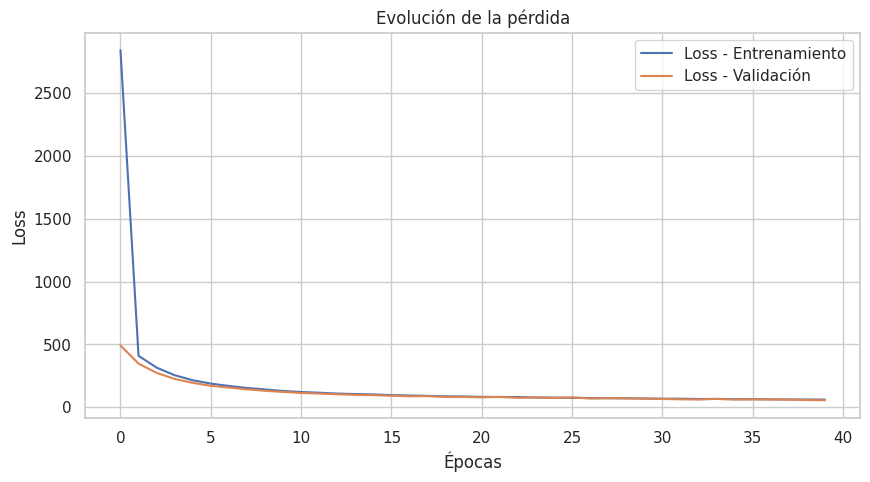

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Loss - Entrenamiento')
plt.plot(history.history['val_loss'], label='Loss - Validación')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.title('Evolución de la pérdida')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
y_pred = mymodel.predict(X_test_norm)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# 3. Mostrar resultados
print(f"MAE en test: {mae:.2f}")
print(f"RMSE en test: {rmse:.2f}")

220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE en test: 5.94
RMSE en test: 8.05


In [ ]:
y_pred_train = mymodel.predict(X_train_norm)

mae_train = mean_absolute_error(y_train, y_pred_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))

print(f"MAE en entrenamiento: {mae_train:.2f}")
print(f"RMSE en entrenamiento: {rmse_train:.2f}")

877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MAE en entrenamiento: 5.59
RMSE en entrenamiento: 7.53


#### Modelo base modificado

In [ ]:
propio = df.copy()

X = propio.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR'])
X = X.select_dtypes(include=np.number)
y = propio['SPOT_ESP']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)


scaler = StandardScaler()
scaler.fit(X_train)

X_train_norm = scaler.transform(X_train)
X_test_norm = scaler.transform(X_test)

def build_model():
    model = models.Sequential()
    model.add(layers.Dense(128, activation='relu', input_shape=(X_train_norm.shape[1],)))
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(1))

    model.compile(
        optimizer='adam',
        loss='mse',
        metrics=[tf.keras.metrics.MeanAbsoluteError()]
    )
    return model

mymodel = build_model()

history = mymodel.fit(
    X_train_norm,
    y_train,
    validation_data=(X_test_norm, y_test),
    epochs=70,
    batch_size=64,
    verbose=1
)

y_pred_test = mymodel.predict(X_test_norm)

mae_test = mean_absolute_error(y_test, y_pred_test)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

print(f"MAE en test: {mae_test:.2f}")
print(f"RMSE en test: {rmse_test:.2f}")

X_2025_sel = df2025[X.columns]
X_2025_norm = scaler.transform(X_2025_sel)

y_2025_real = df2025['SPOT_ESP'].values
y_pred_2025 = mymodel.predict(X_2025_norm)

mae_2025 = mean_absolute_error(y_2025_real, y_pred_2025)
rmse_2025 = np.sqrt(mean_squared_error(y_2025_real, y_pred_2025))

print(f"\nMAE en datos 2025: {mae_2025:.2f}")
print(f"RMSE en datos 2025: {rmse_2025:.2f}")

Epoch 1/70


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



439/439 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 5076.0283 - mean_absolute_error: 46.6330 - val_loss: 334.1894 - val_mean_absolute_error: 13.3111
Epoch 2/70
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 288.3614 - mean_absolute_error: 12.5841 - val_loss: 205.8636 - val_mean_absolute_error: 10.7518
Epoch 3/70
439/439 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 184.2593 - mean_absolute_error: 10.1888 - val_loss: 169.0094 - val_mean_absolute_error: 9.9035
Epoch 4/70
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 137.9625 - mean_absolute_error: 8.8106 - val_loss: 118.2119 - val_mean_absolute_error: 8.2112
Epoch 5/70
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 109.9572 - mean_absolute_error: 7.9092 - val_loss: 109.6561 - val_mean_absolute_error: 7.9526
Epoch 6/70
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 95.9694 - mean_absolute_error: 7.3463 - val_loss: 90.4724 - val_mean_absolute_error: 7.1762
Epoch 7/70
439/439 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 84.1208 - mean_absolute

In [ ]:
y_pred_train = mymodel.predict(X_train_norm)

mae_train = mean_absolute_error(y_train, y_pred_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))

print(f"MAE en entrenamiento: {mae_train:.2f}")
print(f"RMSE en entrenamiento: {rmse_train:.2f}")

877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MAE en entrenamiento: 3.80
RMSE en entrenamiento: 4.97


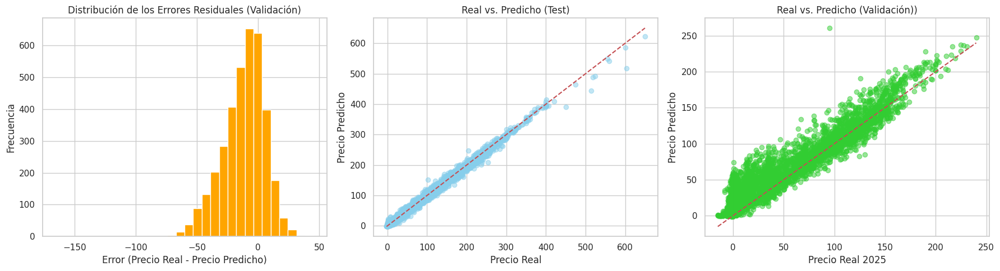

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

errors_2025 = y_2025_real - y_pred_2025.flatten()
axs[0].hist(errors_2025, bins=30, color='orange')
axs[0].set_xlabel('Error (Precio Real - Precio Predicho)')
axs[0].set_ylabel('Frecuencia')
axs[0].set_title('Distribución de los Errores Residuales (Validación)')
axs[0].grid(True)

axs[1].scatter(y_test, y_pred_test, alpha=0.5, color='skyblue')
axs[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axs[1].set_title('Real vs. Predicho (Test)')
axs[1].set_xlabel('Precio Real')
axs[1].set_ylabel('Precio Predicho')
axs[1].grid(True)

axs[2].scatter(y_2025_real, y_pred_2025, alpha=0.5, color='limegreen')
axs[2].plot([y_2025_real.min(), y_2025_real.max()], [y_2025_real.min(), y_2025_real.max()], 'r--')
axs[2].set_title('Real vs. Predicho (Validación))')
axs[2].set_xlabel('Precio Real 2025')
axs[2].set_ylabel('Precio Predicho')
axs[2].grid(True)

plt.tight_layout()
plt.show()

#### Keras tuner

In [ ]:
keras = df.copy()

X = keras.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR'])
X = X.select_dtypes(include=np.number)
y = keras['SPOT_ESP']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

scaler = StandardScaler()
scaler.fit(X_train)

X_train_norm = scaler.transform(X_train)
X_test_norm = scaler.transform(X_test)

feature_columns = X.columns

def build_model(hp):
    model = models.Sequential()
    activation_choice = hp.Choice('activation', values=['relu', 'leaky_relu', 'elu'])
    learning_rate = hp.Choice('learning_rate', values=[0.01, 0.001, 0.0005])


    model.add(layers.Dense(
        units=hp.Int('units_input', min_value=32, max_value=256, step=32),
        input_shape=(X_train_norm.shape[1],)
    ))


    if activation_choice == 'leaky_relu':
        model.add(LeakyReLU())
    else:
        model.add(layers.Activation(activation_choice))

    for i in range(hp.Int('n_layers', 1, 3)):
        model.add(layers.Dense(
            units=hp.Int(f'units_{i}', min_value=32, max_value=256, step=32)
        ))

        if activation_choice == 'leaky_relu':
            model.add(LeakyReLU())
        else:
            model.add(layers.Activation(activation_choice))

    model.add(layers.Dense(1))

    optimizer_choice = hp.Choice('optimizer', values=['adam', 'rmsprop', 'nadam'])

    if optimizer_choice == 'adam':
        optimizer = optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'rmsprop':
        optimizer = optimizers.RMSprop(learning_rate=learning_rate)
    else:
        optimizer = optimizers.Nadam(learning_rate=learning_rate)

    model.compile(
        optimizer=optimizer,
        loss='mse',
        metrics=['mae']
    )

    return model


tuner = RandomSearch(
    build_model,
    objective='val_mae',
    max_trials=5,
    executions_per_trial=1,
    directory='tuning_dir',
    project_name='PFG'
)

tuner.search(X_train_norm, y_train, epochs=50, validation_split=0.2, batch_size=64, verbose=1)

best_model = tuner.get_best_models(num_models=1)[0]


y_pred_test = best_model.predict(X_test_norm)
mae_test = mean_absolute_error(y_test, y_pred_test)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

print(f"Test MAE: {mae_test:.2f}")
print(f"Test RMSE: {rmse_test:.2f}")

X_2025_sel = df2025[feature_columns]
X_2025_norm = scaler.transform(X_2025_sel)

y_2025_real = df2025['SPOT_ESP'].values
y_pred_2025 = best_model.predict(X_2025_norm)

mae_2025 = mean_absolute_error(y_2025_real, y_pred_2025)
rmse_2025 = np.sqrt(mean_squared_error(y_2025_real, y_pred_2025))

print(f"\nDatos 2025 - MAE: {mae_2025:.2f}")
print(f"Datos 2025 - RMSE: {rmse_2025:.2f}")

Reloading Tuner from tuning_dir/PFG/tuner0.json


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning:

Skipping variable loading for optimizer 'nadam', because it has 2 variables whereas the saved optimizer has 15 variables. 



220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Test MAE: 4.58
Test RMSE: 6.38
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

Datos 2025 - MAE: 13.57
Datos 2025 - RMSE: 17.74


In [ ]:
best_model.summary()
best_hp = tuner.get_best_hyperparameters(1)[0]
print("Mejores hiperparámetros encontrados:")
print(best_hp.values)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 160)            │         8,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 160)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,473 (193.25 KB)

 Trainable params: 49,473 (193.25 KB)

 Non-trainable params: 0 (0.00 B)

Mejores hiperparámetros encontrados:
{'activation': 'leaky_relu', 'learning_rate': 0.01, 'units_input': 160, 'n_layers': 1, 'units_0': 256, 'optimizer': 'nadam'}


In [ ]:
y_pred_train = best_model.predict(X_train_norm)

mae_train = mean_absolute_error(y_train, y_pred_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))

print(f"MAE en entrenamiento: {mae_train:.2f}")
print(f"RMSE en entrenamiento: {rmse_train:.2f}")

877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
MAE en entrenamiento: 4.04
RMSE en entrenamiento: 5.40


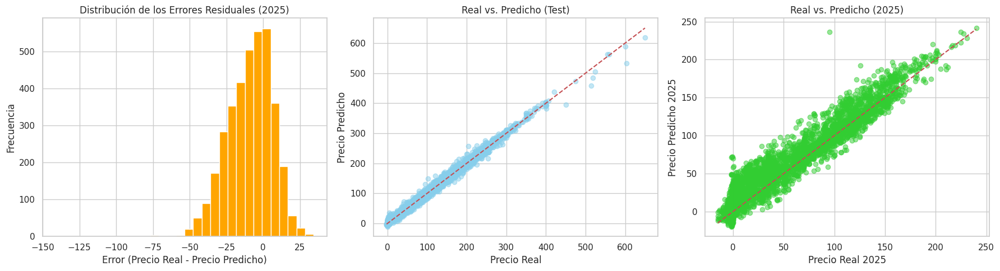

In [ ]:
errors_2025 = y_2025_real - y_pred_2025.flatten()

fig, axs = plt.subplots(1, 3, figsize=(18, 5))


axs[0].hist(errors_2025, bins=30, color='orange')
axs[0].set_xlabel('Error (Precio Real - Precio Predicho)')
axs[0].set_ylabel('Frecuencia')
axs[0].set_title('Distribución de los Errores Residuales (2025)')
axs[0].grid(True)

axs[1].scatter(y_test, y_pred_test, alpha=0.5, color='skyblue')
axs[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axs[1].set_xlabel('Precio Real')
axs[1].set_ylabel('Precio Predicho')
axs[1].set_title('Real vs. Predicho (Test)')
axs[1].grid(True)

axs[2].scatter(y_2025_real, y_pred_2025, alpha=0.5, color='limegreen')
axs[2].plot([y_2025_real.min(), y_2025_real.max()], [y_2025_real.min(), y_2025_real.max()], 'r--')
axs[2].set_xlabel('Precio Real 2025')
axs[2].set_ylabel('Precio Predicho 2025')
axs[2].set_title('Real vs. Predicho (2025)')
axs[2].grid(True)

plt.tight_layout()
plt.show()

# Recrear escenarios diferentes


Para recrear escenarios diferentes, vamos a crear datos.

In [ ]:
datos = df.copy()

In [ ]:
pot_actual = 36149
pot_2030 = 62054

max_gen_actual = df['Eólica'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación eólica estimada para 2030: {max_gen_estimado_2030:.0f} MWh")


Máxima generación eólica estimada para 2030: 70213 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 1.7166


In [ ]:
pot_actual = 46501
pot_2030 = 76277

max_gen_actual = df['Solar fotovoltaica'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Solar fotovoltaica estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Solar fotovoltaica estimada para 2030: 32614 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 1.6403


In [ ]:
pot_actual = 2304
pot_2030 = 4804

max_gen_actual = df['Solar térmica'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Solar térmica estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Solar térmica estimada para 2030: 4549 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 2.0851


In [ ]:
pot_actual = 14261
pot_2030 = 14511

max_gen_actual = df['Hidráulica'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Hidráulica estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Hidráulica estimada para 2030: 10448 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 1.0175


In [ ]:
pot_actual = 240
pot_2030 = 440

max_gen_actual = df['Biogás'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Biogás estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Biogás estimada para 2030: 211 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 1.8333


In [ ]:
pot_actual = 10159
pot_2030 = 0

max_gen_actual = df['Carbón'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación carbón estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación carbón estimada para 2030: 0 MWh


In [ ]:
pot_actual = 1009
pot_2030 = 1409

max_gen_actual = df['Biomasa'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Biomasa estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Biomasa estimada para 2030: 797 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 1.3964


In [ ]:
pot_actual = 26612
pot_2030 = 26612

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Ciclo combinado estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Ciclo combinado estimada para 2030: 570 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 1.0000


In [ ]:
pot_actual = 4068
pot_2030 = 3784

max_gen_actual = df['Cogeneración'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Cogeneración estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Cogeneración estimada para 2030: 3419 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 0.9302


In [ ]:
pot_actual = 470
pot_2030 = 342
max_gen_actual = df['Otras no renovables'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Otras no renovables estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Otras no renovables estimada para 2030: 2150 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 0.7277


In [ ]:
pot_actual = 7399
pot_2030 = 3181

max_gen_actual = df['Nuclear'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Nuclear estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Nuclear estimada para 2030: 3062 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 0.4299


In [ ]:
pot_actual = 9289
pot_2030 = 18913

max_gen_actual = df['Total Almacenamiento'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Total Almacenamiento estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Total Almacenamiento estimada para 2030: 5100 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 2.0361


In [ ]:
pot_actual = 2847
pot_2030 = 1830

max_gen_actual = df['Gas Natural Cogeneración'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Gas Natural Cogeneración estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Gas Natural Cogeneración estimada para 2030: 2145 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 0.6428


In [ ]:
pot_actual = 25
pot_2030 = 80

max_gen_actual = df['Otras renovables'].max()

max_gen_estimado_2030 = max_gen_actual * (pot_2030 / pot_actual)
print(f"Máxima generación Otras renovables estimada para 2030: {max_gen_estimado_2030:.0f} MWh")

Máxima generación Otras renovables estimada para 2030: 67407 MWh


In [ ]:
factor_ajuste = pot_2030 / pot_actual
print(f"El factor de ajuste es: {factor_ajuste:.4f}")

El factor de ajuste es: 3.2000


Se prevé que la demanda suba a un ritmo anual de 1,3% hasta 2030

In [ ]:
df['Demanda_2030'] = df['Demanda Peninsular'] * 1.34

In [ ]:
df['tmed_hourly2030'] = df['tmed_hourly'] + 1.5

https://www.miteco.gob.es/content/dam/miteco/es/cambio-climatico/temas/impactos-vulnerabilidad-y-adaptacion/pnacc-2021-2030_tcm30-512163.pdf

In [ ]:
df['PrecioGas2030'] = df['PrecioGas'] * 1.0241

https://mcusercontent.com/6e80a001fed29014a95f31e0e/files/9b306286-2e82-54c1-01e8-6c9891ca4a98/ER_ENERGY_OUTLOOK_2025.pdf

In [ ]:
df['TurbinaciónBombeo2023'] = df['Turbinación bombeo'] * 1.0175

In [ ]:
interconexion_cols = [
    'Exportación Marruecos', 'Exportación Francia', 'Exportación Portugal',
    'Exportación Andorra', 'Importación Francia', 'Importación Marruecos',
    'Importación Portugal', 'Exportación Total', 'Importación Total'
]

for col in interconexion_cols:
    if col in df.columns:
        df[f'{col}_2030'] = df[col] * 1.30

In [ ]:
escenario_2030 = datos.copy()

escenario_2030['Eólica'] *= 1.7166
escenario_2030['Solar fotovoltaica'] *= 1.6403
escenario_2030['Solar térmica'] *= 2.0851
escenario_2030['Hidráulica'] *= 1.0175
escenario_2030['Turbinación bombeo'] *= 1.62
escenario_2030['Biogás'] *= 1.8333
escenario_2030['Biomasa'] *= 1.3964
escenario_2030['Carbón'] *= 0
escenario_2030['Ciclo combinado'] *= 1.00
escenario_2030['Gas Natural Cogeneración'] *= 0.6428
escenario_2030['Nuclear'] *= 0.4299
escenario_2030['Demanda Peninsular'] *= 1.05
escenario_2030['Otras no renovables'] *=  0.7277
escenario_2030['Total Almacenamiento'] *=  2.0361
escenario_2030['Otras renovables'] *=  2.200
escenario_2030['tmed_hourly'] += 1.55
escenario_2030['PrecioGas'] *= 1.0241

escenario_2030['Generacion_Solar'] = escenario_2030['Solar fotovoltaica'] + escenario_2030['Solar térmica']
escenario_2030['Generacion_CCGT'] = escenario_2030['Ciclo combinado'] + escenario_2030['Gas Natural Cogeneración'] + escenario_2030['Cogeneración']
escenario_2030['Hueco_Termico'] = escenario_2030['Demanda Peninsular'] - escenario_2030['Generacion_Solar'] - escenario_2030['Eólica']


Mejor modelo escogido

In [ ]:
propio = datos.copy()

X = propio.drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR', 'Hidráulica no UGH', 'Hidráulica UGH'])
X = X.select_dtypes(include=np.number)
y = propio['SPOT_ESP']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

scaler = StandardScaler()
scaler.fit(X_train)

X_train_norm = scaler.transform(X_train)
X_test_norm = scaler.transform(X_test)

def build_model():
    model = models.Sequential()
    model.add(layers.Dense(128, activation='relu', input_shape=(X_train_norm.shape[1],)))
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=[tf.keras.metrics.MeanAbsoluteError()])
    return model

mymodel = build_model()

history = mymodel.fit(
    X_train_norm,
    y_train,
    validation_data=(X_test_norm, y_test),
    epochs=40,
    batch_size=64,
    verbose=1
)

y_pred_test = mymodel.predict(X_test_norm)
mae_test = mean_absolute_error(y_test, y_pred_test)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

print(f"MAE en test: {mae_test:.2f}")
print(f"RMSE en test: {rmse_test:.2f}")

Epoch 1/40


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 5212.9268 - mean_absolute_error: 47.2691 - val_loss: 396.6388 - val_mean_absolute_error: 14.9173
Epoch 2/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 330.2751 - mean_absolute_error: 13.6719 - val_loss: 227.8163 - val_mean_absolute_error: 11.1818
Epoch 3/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 202.1467 - mean_absolute_error: 10.6535 - val_loss: 155.0125 - val_mean_absolute_error: 9.4045
Epoch 4/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 144.0524 - mean_absolute_error: 9.0786 - val_loss: 132.6685 - val_mean_absolute_error: 8.7064
Epoch 5/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 113.1939 - mean_absolute_error: 8.0415 - val_loss: 118.8838 - val_mean_absolute_error: 8.0631
Epoch 6/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 101.2760 - mean_absolute_error: 7.5397 - val_loss: 116.5819 - val_mean_absolute_error: 8.2796
Epoch 7/40
439/439 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 91.0827 - mean_absolu

In [ ]:
precios_reales_anuales = datos.copy()
precios_reales_anuales['Año'] = pd.to_datetime(precios_reales_anuales['datetime']).dt.year
precios_reales_anuales = precios_reales_anuales.groupby('Año')['SPOT_ESP'].mean().reset_index(name='Precio_Medio')

X_2030_sel = escenario_2030[X.columns]
X_2030_norm = scaler.transform(X_2030_sel)
y_pred_2030 = mymodel.predict(X_2030_norm)
escenario_2030['Pred_SPOT_2030'] = y_pred_2030.flatten()

escenario_2030['Fecha'] = pd.to_datetime(escenario_2030['datetime']).dt.date
precios_2030_diarios = escenario_2030.groupby('Fecha')['Pred_SPOT_2030'].mean().reset_index()

precio_2030_medio = precios_2030_diarios['Pred_SPOT_2030'].mean()


1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


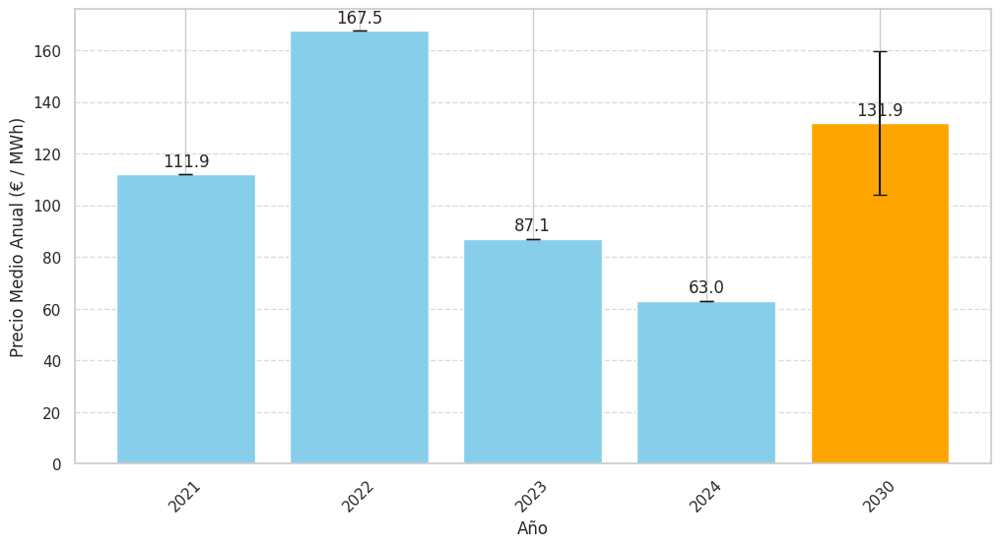

In [ ]:
años = list(precios_reales_anuales['Año'].astype(str)) + ['2030']
precios = list(precios_reales_anuales['Precio_Medio']) + [precio_2030_medio]


error_2030 = precio_2030_medio * 0.2097
errores = [0] * (len(precios) - 1) + [error_2030]


plt.figure(figsize=(12, 6))
bars = plt.bar(años, precios, color=['skyblue'] * len(precios_reales_anuales) + ['orange'], yerr=errores, capsize=5)


for bar in bars:
    height = bar.get_height()
    plt.annotate(f'{height:.1f}',
                 xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 3),
                 textcoords="offset points",
                 ha='center', va='bottom')

plt.xlabel('Año')
plt.ylabel('Precio Medio Anual (€ / MWh)')
plt.title('')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.show()

                            Media 2024    Media 2030  Cambio (%)
Eólica                    13652.903442  23698.872905   73.581195
Solar fotovoltaica         5086.626231   6070.535798   19.343068
Solar térmica               512.895076   1122.624661  118.879984
Hidráulica                 4118.896163   3212.843740  -21.997457
Turbinación bombeo          484.086375    646.812485   33.615098
Biogás                       80.933287    165.226769  104.151809
Biomasa                     348.453652    552.006562   58.416065
Carbón                      333.667682      0.000000 -100.000000
Ciclo combinado            3146.280878   4739.427832   50.635878
Gas Natural Cogeneración   1809.802042   1339.195546  -26.003203
Nuclear                    5938.660992   2656.911653  -55.260762
Demanda Peninsular        26406.786113  28171.178769    6.681588
Otras no renovables         691.684598    782.777556   13.169725
Otras renovables           7458.496813  16653.360722  123.280389
Total Almacenamiento     

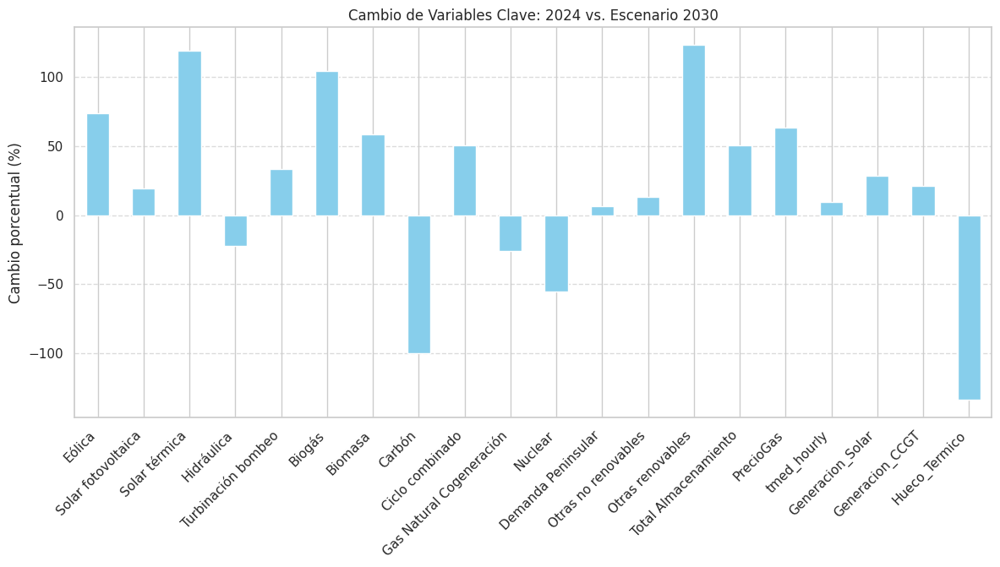

In [ ]:
variables_clave = ['Eólica', 'Solar fotovoltaica', 'Solar térmica', 'Hidráulica', 'Turbinación bombeo',
                   'Biogás', 'Biomasa', 'Carbón', 'Ciclo combinado', 'Gas Natural Cogeneración',
                   'Nuclear', 'Demanda Peninsular', 'Otras no renovables', 'Otras renovables',
                   'Total Almacenamiento', 'PrecioGas', 'tmed_hourly', 'Generacion_Solar', 'Generacion_CCGT', 'Hueco_Termico']

datos['Año'] = pd.to_datetime(datos['datetime']).dt.year
medias_2024 = datos[datos['Año'] == 2024][variables_clave].mean()

medias_2030 = escenario_2030[variables_clave].mean()

comparacion_medias = pd.DataFrame({'Media 2024': medias_2024, 'Media 2030': medias_2030})
comparacion_medias['Cambio (%)'] = ((comparacion_medias['Media 2030'] - comparacion_medias['Media 2024']) / comparacion_medias['Media 2024']) * 100

print(comparacion_medias)

comparacion_medias['Cambio (%)'].plot(kind='bar', figsize=(14, 6), color='skyblue')
plt.ylabel('Cambio porcentual (%)')
plt.title('Cambio de Variables Clave: 2024 vs. Escenario 2030')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
df

,datetime,hour,Turbinación bombeo,Exportación Andorra,Nuclear,Solar fotovoltaica,Hidráulica,Generación + Bombeo + Cable,Exportación Marruecos,Exportación Francia,Gas Natural Cogeneración,Importación Portugal,Cogeneración,Hidráulica no UGH,Generación P48 total,Ciclo combinado,Biomasa,Exportación Portugal,Exportación Total,Generación + Interconexiones,Importación Francia,Biogás,Solar térmica,Importación Total,Enlace Baleares,Carbón,Hidráulica UGH,Importación Marruecos,Consumo bombeo,Demanda Peninsular,Total Almacenamiento,Energía residual,Ajuste P48,Otras renovables,Eólica,SPOT_ESP,SPOT_FR,SPOT_POR,GenCO2,PrecioGas,PVPC,DiaSemana,TipoDia,HoraTrabajo,Año,Estacion,Generacion_Solar,Generacion_CCGT,Hueco_Termico,tmed_hourly,pmed_hourly,Otras no renovables,date,Mes
0,2021-01-01 00:00:00,0.0,86.80,-40.0,7106.10,1.100,5092.90,25218.400,0.0,-2463.40,2091.300,615.100,2175.2,964.30,26920.700,2815.700,454.90,-333.20,-2836.60,24916.900,0.0,82.900,0.000,935.10,-102.0,250.0,4128.60,320.0,-0.3,23316.900,86.5,0.400,-1600.00,9269.40,17323.2,48.19,48.19,48.19,21415.0,20.58,67.36,4.0,2.0,0.0,2021,0.0,1.1,7082.200,7548.100,5.329728,0.137714,650.500,2021-01-01,1
1,2021-01-01 01:00:00,1.0,0.00,-37.0,7106.10,10.700,4075.00,24264.800,0.0,-3561.00,2080.400,482.300,2164.3,938.70,25866.900,2555.200,456.70,-374.00,-3972.00,22956.100,361.0,82.900,0.000,1163.30,-102.0,243.0,3136.30,320.0,-0.1,21456.100,-0.1,0.400,-1500.00,9589.20,17960.2,44.68,44.68,44.68,20379.0,20.58,64.50,4.0,2.0,0.0,2021,0.0,10.7,6799.900,5359.200,5.147910,0.137714,642.800,2021-01-01,1
2,2021-01-01 02:00:00,2.0,0.00,-35.0,7106.10,0.000,3468.00,22848.700,0.0,-3561.00,2074.200,600.000,2158.1,930.80,25203.900,2289.300,464.60,-902.20,-4498.20,21031.500,361.0,82.800,0.000,1281.00,-102.0,265.0,2537.20,320.0,-853.2,19631.500,-853.2,0.400,-1400.00,9793.40,18346.0,38.50,42.92,38.50,19860.0,20.58,58.45,4.0,2.0,0.0,2021,0.0,0.0,6521.600,3352.400,4.966091,0.137714,669.500,2021-01-01,1
3,2021-01-01 03:00:00,3.0,0.00,-34.0,7106.10,0.000,3306.40,22629.100,0.0,-3746.00,2071.900,193.600,2155.8,857.40,24899.200,1989.600,468.60,-1216.70,-4996.70,19442.000,546.0,80.500,0.000,1109.60,-102.0,250.0,2449.00,370.0,-1468.1,18742.000,-1468.1,0.400,-700.00,9967.40,18677.4,36.80,40.39,36.80,18953.0,20.58,56.59,4.0,2.0,0.0,2021,0.0,0.0,6217.300,2297.200,4.784273,0.137714,660.900,2021-01-01,1
4,2021-01-01 04:00:00,4.0,0.00,-34.0,7105.10,0.000,2988.60,22540.800,0.0,-3746.00,2073.400,155.200,2157.3,854.30,24735.800,1826.000,469.00,-1274.40,-5054.40,18857.600,546.0,80.100,2.000,1071.20,-102.0,265.0,2134.30,370.0,-1793.0,18557.600,-1793.0,0.400,-300.00,10267.80,19269.6,36.55,40.20,36.55,18497.0,20.58,56.41,4.0,2.0,0.0,2021,0.0,2.0,6056.700,1815.700,4.602455,0.137714,680.400,2021-01-01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35058,2024-12-31 18:00:00,18.0,1158.40,-49.0,7089.00,12.300,7021.35,29588.800,-220.0,-185.00,1718.000,326.525,1762.1,641.30,30400.550,10027.800,337.50,-1729.15,-2183.15,31675.300,3422.0,74.300,38.500,3697.90,-240.0,500.0,6380.05,0.0,0.0,31103.550,1196.8,1.500,-571.75,2721.40,4189.2,159.44,92.78,159.44,16654.0,49.28,274.90,1.0,0.0,1.0,2024,0.0,50.8,13507.900,21869.150,7.644145,0.038113,811.300,2024-12-31,12
35059,2024-12-31 19:00:00,19.0,705.05,-49.0,7089.00,1.300,5843.45,28984.700,-190.0,-185.00,1701.800,252.875,1742.7,637.40,29259.700,9917.500,337.70,-2082.00,-2506.00,30269.100,3422.0,75.300,38.200,3740.40,-225.0,500.0,5206.05,0.0,0.0,30219.100,1145.6,1.500,-50.00,2950.65,4634.5,156.10,79.04,156.10,17248.0,49.28,271.27,1.0,0.0,0.0,2024,0.0,39.5,13362.000,20773.350,7.462327,0.038113,808.400,2024-12-31,12
35060,2024-12-31 20:00:00,20.0,192.05,-43.0,7089.00,1.400,4714.45,26906.000,0.0,-185.00,1695.700,262.400,1736.6,629.70,27081.000,9584.350,333.20,-1855.55,-2083.55,28504.650,3422.0,76.400,28.600,3657.20,-150.0,500.0,4084.75,

275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


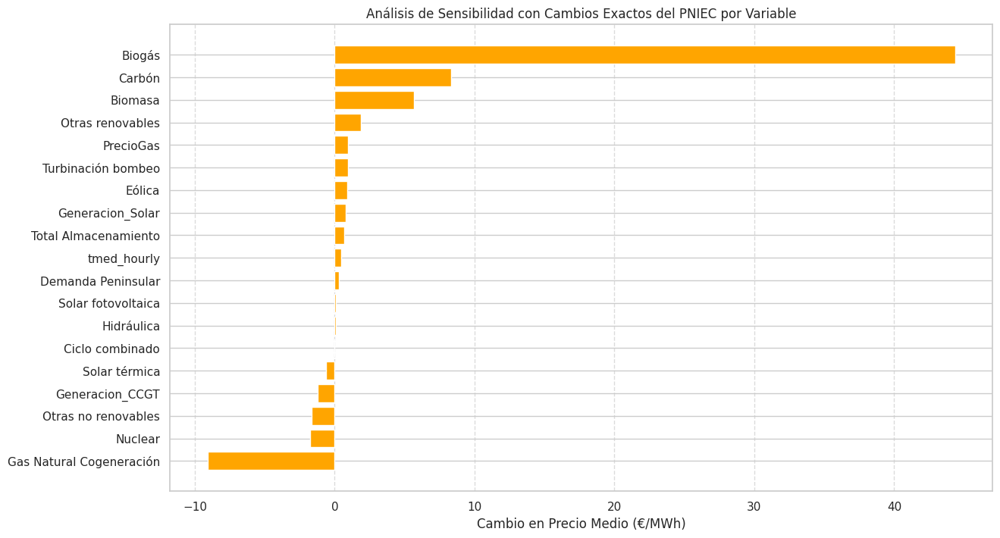

In [ ]:
cambios_pniec = {
    'Eólica': 1.7166,
    'Solar fotovoltaica': 1.6403,
    'Solar térmica': 2.0851,
    'Hidráulica': 1.0175,
    'Turbinación bombeo': 1.62,
    'Biogás': 1.8333,
    'Biomasa': 1.3964,
    'Carbón': 0,
    'Ciclo combinado': 1.00,
    'Gas Natural Cogeneración': 0.6428,
    'Nuclear': 0.4299,
    'Demanda Peninsular': 1.05,
    'Otras no renovables': 0.7277,
    'Total Almacenamiento': 2.0361,
    'Otras renovables': 2.200,
    'tmed_hourly': 1.55,  # Este es un incremento absoluto, no un porcentaje
    'PrecioGas': 1.0241,
    'Generacion_Solar': 1.86,
    'Generacion_CCGT': 0.82,
}

df_2024['Generacion_Solar'] = df_2024['Solar fotovoltaica'] + df_2024['Solar térmica']
df_2024['Generacion_CCGT'] = df_2024['Ciclo combinado'] + df_2024['Gas Natural Cogeneración'] + df_2024['Cogeneración']
feature_columns = list(df_2024.select_dtypes(include='number').drop(columns=['SPOT_ESP', 'SPOT_POR', 'SPOT_FR']).columns)

impactos = {}

for variable in cambios_pniec.keys():
    df_simulado = df_2024.copy()

    if variable == 'tmed_hourly':
        df_simulado[variable] = df_simulado[variable] + cambios_pniec[variable]
    else:

        df_simulado[variable] = df_simulado[variable] * cambios_pniec[variable]


    X_simulado = df_simulado[feature_columns]
    X_simulado_norm = scaler.transform(X_simulado)


    precios_pred = mymodel.predict(X_simulado_norm).flatten()
    precio_medio_simulado = np.mean(precios_pred)
    impacto = precio_medio_simulado - precio_base
    impactos[variable] = impacto

impactos_df = pd.DataFrame(list(impactos.items()), columns=['Variable', 'Impacto en Precio Medio'])
impactos_df = impactos_df.sort_values(by='Impacto en Precio Medio', ascending=False)

plt.figure(figsize=(14, 8))
plt.barh(impactos_df['Variable'], impactos_df['Impacto en Precio Medio'], color='orange')
plt.xlabel('Cambio en Precio Medio (€/MWh)')
plt.title('Análisis de Sensibilidad con Cambios Exactos del PNIEC por Variable')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.gca().invert_yaxis()
plt.show()

In [ ]:
impactos_df

,Variable,Impacto en Precio Medio
5,Biogás,44.373466
7,Carbón,8.314651
6,Biomasa,5.665710
14,Otras renovables,1.866730
16,PrecioGas,0.945911
4,Turbinación bombeo,0.927204
0,Eólica,0.881760
17,Generacion_Solar,0.802864
13,Total Almacenamiento,0.675831
15,tmed_hourly,0.467251


## Enfoque diferente

In [ ]:
variables_clave = [
    'Eólica',
    'Generacion_Solar',
    'Nuclear',
    'Hidráulica',
    'Generacion_CCGT',
    'Total Almacenamiento',
    'Demanda Peninsular',
    'PrecioGas',
    'Otras no renovables',
    'Otras renovables',
    'Carbón',
    'Biogás'
]

correlaciones = datos[variables_clave + ['SPOT_ESP']].corr()['SPOT_ESP'].drop('SPOT_ESP').sort_values()

print("Correlaciones con el precio SPOT:")
print(correlaciones)

Correlaciones con el precio SPOT:
Generacion_Solar       -0.250966
Eólica                 -0.201603
Otras renovables       -0.186664
Hidráulica             -0.166561
Nuclear                 0.113477
Demanda Peninsular      0.229105
Total Almacenamiento    0.412634
Biogás                  0.569759
Carbón                  0.608938
Generacion_CCGT         0.674399
PrecioGas               0.681289
Otras no renovables     0.684401
Name: SPOT_ESP, dtype: float64


Modelo:
Precio_Estimado = -69.07 - 0.0008 * Eólica - 0.0015 * Generacion_Solar - 0.0046 * Nuclear - 0.0050 * Hidráulica + 0.0261 * Generacion_CCGT + 0.0098 * Total Almacenamiento + 0.0014 * Demanda Peninsular + 1.3315 * PrecioGas - 0.0246 * Ciclo combinado - 0.0660 * Otras no renovables + 0.0707 * Carbón + 0.4636 * Biogás 

R²: 0.7904


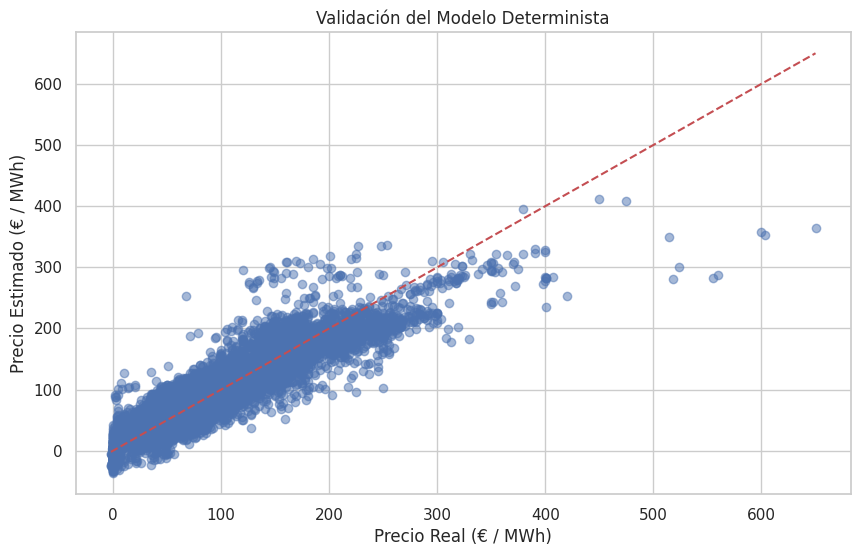

In [ ]:
variables= [
    'Eólica',
    'Generacion_Solar',
    'Nuclear',
    'Hidráulica',
    'Generacion_CCGT',
    'Total Almacenamiento',
    'Demanda Peninsular',
    'PrecioGas',
    'Ciclo combinado',
    'Otras no renovables',
    'Carbón',
    'Biogás'
]

datos = df.copy()

X = datos[variables]
y = datos['SPOT_ESP']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

modelo_determinista = LinearRegression()
modelo_determinista.fit(X_train, y_train)


intercepto = modelo_determinista.intercept_
coeficientes = modelo_determinista.coef_

print("Modelo:")
print(f"Precio_Estimado = {intercepto:.2f}", end=' ')
for i, var in enumerate(variables):
    signo = '+' if coeficientes[i] >= 0 else '-'
    print(f"{signo} {abs(coeficientes[i]):.4f} * {var}", end=' ')
print("\n")


y_pred_test = modelo_determinista.predict(X_test)

r2 = r2_score(y_test, y_pred_test)

print(f"R²: {r2:.4f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Precio Real (€ / MWh)')
plt.ylabel('Precio Estimado (€ / MWh)')
plt.title('Validación del Modelo Determinista')
plt.grid(True)
plt.show()

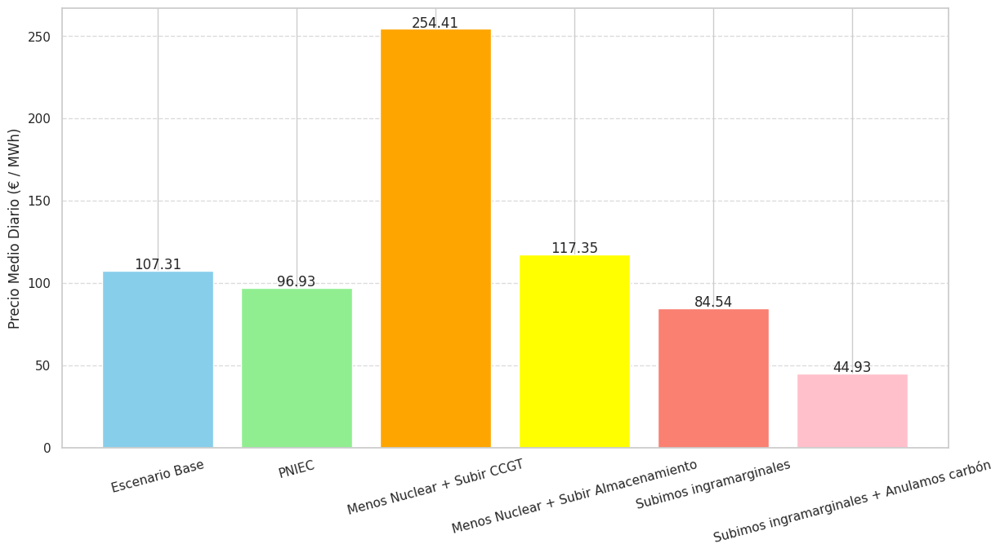

In [ ]:
escenario_base = datos.copy()

escenarios = {
    'Escenario Base': {},

    'PNIEC': {'Nuclear': 0.57, 'Eólica': 1.7, 'Generacion_Solar': 1.7, 'Total Almacenamiento': 2.0, 'Biogás': 1.8, 'Carbón': 0},

    'Menos Nuclear + Subir CCGT': {'Nuclear': 0.57, 'Generacion_CCGT': 1.57},

    'Menos Nuclear + Subir Almacenamiento': {'Nuclear': 0.57, 'Total Almacenamiento': 1.5},

    'Subimos ingramarginales': {'Nuclear': 1.5 , 'Eólica': 1.5, 'Generacion_Solar': 1.5},

    'Subimos ingramarginales + Anulamos carbón': {'Nuclear': 1.5 , 'Eólica': 1.5, 'Generacion_Solar': 1.5, 'Carbón': 0}
}


medias_escenarios = {}

for nombre, cambios in escenarios.items():
    escenario = escenario_base.copy()

    for col, factor in cambios.items():
        escenario[col] *= factor

    X_escenario = escenario[variables]

    precios_simulados = modelo_determinista.predict(X_escenario)
    escenario['Precio_Simulado'] = precios_simulados

    media_diaria = escenario['Precio_Simulado'].mean()

    medias_escenarios[nombre] = media_diaria

plt.figure(figsize=(14, 7))
plt.bar(medias_escenarios.keys(), medias_escenarios.values(), color=['skyblue', 'lightgreen', 'orange', 'yellow', 'salmon', 'pink'])
plt.ylabel('Precio Medio Diario (€ / MWh)')
plt.title('')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, (escenario, media) in enumerate(medias_escenarios.items()):
    plt.text(i, media + 1, f'{media:.2f}', ha='center')

plt.xticks(rotation=15)
plt.show()